# <font color=green>deepBreaks Applications</font>
## Modeling spectral tuning sites of opsin proteins based on amino-acid sequence...  

# <font color=red>Step 0: mySQL DB Setup -</font> Script 0
## *The following script sets up the schema for our vizphiz database.*
```

In [ ]:
#All neccessary packages to import for data process steps.
import mysql
import mysql.connector
#install mysql-connector-python // NOT mysql-connector
import re
import os
import datetime 
import subprocess
import shutil 

In [ ]:
mydb = mysql.connector.connect(
  host="localhost",
  user="root",
  password= "Geass5566!!")

mycursor = mydb.cursor()

try:
  mycursor.execute("""
  DROP DATABASE vizphiz_db;
  """)
  mydb.commit() 
except:
  "vizphiz_db does not yet exist!"
  pass

mycursor.execute("""
CREATE DATABASE vizphiz_db;
""")
mydb.commit() 

mycursor.execute("""
USE vizphiz_db;
""")
mydb.commit() 


mycursor.execute("""
CREATE TABLE lamdamax
(
id int unsigned not null primary key,
genus varchar(50),
species varchar(50),
celltype varchar(50),
cellsubtype varchar(50),
lamdamax decimal(9,5),
error decimal(9,5),
chromophore varchar(50),
method varchar(50),
stage varchar(50),
refid int,
notes varchar(1000)
);
""")
mydb.commit() 


mycursor.execute("""
CREATE TABLE heterologous
(
hetid int unsigned not null primary key,
genus varchar(50),
species varchar(50),
accession varchar(500),
mutations varchar(500),
lamdamax decimal(9,5),
error decimal(9,5),
cellculture varchar(50),
purification varchar(50),
spectrum varchar(50),
sourcetype varchar(50),
refid int,
notes varchar(1000)
);
""")
mydb.commit() 


mycursor.execute("""
CREATE TABLE links
(
linkid int unsigned not null primary key,
accession varchar(500),
maxid int,
refid int,
evidence varchar(1000)
);
""")
mydb.commit() 


mycursor.execute("""
CREATE TABLE search
(
searchid int unsigned not null primary key,
researcher varchar(50),
month int,
year int,
engine varchar(500),
keywords varchar(500)
);
""")
mydb.commit() 


mycursor.execute("""
CREATE TABLE opsins
(
opsinid int unsigned not null primary key,
genefamily varchar(50),
genenames varchar(50),
genus varchar(50),
phylum varchar(25),
species varchar(50),
db varchar(50),
accession varchar(500),
dna varchar(10000),
aa varchar(3333),
refid int
);
""")

mydb.commit()

mycursor.execute("""
CREATE TABLE refs
(
refid int,
doilink varchar(100),
searchid int
);
""")
mydb.commit()

mydb.close() 

# <font color=red>STEP 0: Data Base Setup -</font> Script 1 - Import heterologous.tsv into mySQL


In [ ]:
mydb = mysql.connector.connect(
  host="localhost",
  user="root",
  database= "vizphiz",
  password= "Geass5566!!"
)

#read file for data
file1 = open('heterologous.tsv', 'r', encoding="utf8")
Lines = file1.readlines()

count=0
for line in Lines:
    columns = line.split("\t")
    print(columns)
    mycursor = mydb.cursor()

    sql = "INSERT INTO vizphiz_db.heterologous (hetid, genus, species, accession, mutations, lamdamax, error, cellculture, purification, spectrum, sourcetype, refid) VALUES (%s, %s, %s, %s, %s, %s, %s, %s, %s, %s, %s, %s)"
    val = (columns[0], columns[1], columns[2], columns[3], columns[4], columns[5], columns[6], columns[7], columns[8], columns[9], columns[10], columns[11])
    print(sql)
    print(val)

    mycursor.execute(sql, val)

    mydb.commit()

    print(mycursor.rowcount, "record inserted.")

# <font color=red>STEP 0: Data Base Setup -</font> Script 2 - Import opsindb.tsv into mySQL

In [ ]:
mydb = mysql.connector.connect(
  host="localhost",
  user="root",
  database= "vizphiz",
  password= "Geass5566!!"
)

#read file for data
file1 = open('opsindb.tsv', 'r')
Lines = file1.readlines()

count=0
for line in Lines:
    columns = line.split("\t")

    mycursor = mydb.cursor()

    sql = "INSERT INTO vizphiz_db.opsins (opsinid, genefamily, genenames, phylum, genus, species, db, accession, dna, aa, refid) VALUES (%s, %s, %s, %s, %s, %s, %s, %s, %s, %s, %s)"
    val = (columns[0], columns[1], columns[2], columns[3], columns[4], columns[5], columns[6], columns[7], columns[8], columns[9], columns[10])
    print(sql)
    print(val)

    mycursor.execute(sql, val)

    mydb.commit()

    print(mycursor.rowcount, "record inserted.")


# <font color=red>STEP 1: Extract Data From Vizphiz</font>
### Output = 8 different 'versions' // 'splits' of the data. 
2. Strategy = FFT-NS-2 // G-INS-1

In [ ]:
#All neccessary packages to import for data process steps.
import mysql
import mysql.connector
#install mysql-connector-python // NOT mysql-connector
import re
import os
import datetime 
import subprocess
import shutil 

In [ ]:
rod = re.compile('Rh[0-2]|exoRh')
d = re.compile('^NM_001014890.2$|^NM_001014890$')


In [ ]:
#directory preperation
dt_label = datetime.datetime.now().strftime('%Y-%m-%d_%H-%M-%S')
seq_report_dir = str(f'vizphiz_data_splits_{dt_label}')
os.makedirs(seq_report_dir)

wd_output = f'{seq_report_dir}/wds.txt'
sws_output = f'{seq_report_dir}/swd.txt'
mws_output = f'{seq_report_dir}/mwd.txt'
rod_output = f'{seq_report_dir}/rod.txt'
wd_ni_output = f'{seq_report_dir}/wds_ni.txt'
inv_output = f'{seq_report_dir}/inv_only.txt'
nmoc_output = f'{seq_report_dir}/nmoc.txt'
mut_output = f'{seq_report_dir}/mut_only.txt'
wh_metadata = f'{seq_report_dir}/wds_meta.tsv'
sw_metadata = f'{seq_report_dir}/sws_meta.tsv'
mw_metadata = f'{seq_report_dir}/mws_meta.tsv'
rh_metadata = f'{seq_report_dir}/rod_meta.tsv'
wd_ni_metadata = f'{seq_report_dir}/wds_ni_meta.tsv'
inv_metadata = f'{seq_report_dir}/inv_meta.tsv'
nmoc_metadata = f'{seq_report_dir}/nmoc_meta.tsv'
mut_metadata = f'{seq_report_dir}/mut_meta.tsv'

meta_data_list = [wh_metadata,sw_metadata,mw_metadata,rh_metadata,wd_ni_metadata,inv_metadata,nmoc_metadata]

m = 0
s = 0
l = 0
r = 0
c = 0
z = 0
q = 0
mut = 0


In [ ]:
sws = 0
uvs = 0
mws = 0
lws = 0
rh1 = 1
rh2 = 0

sws_reg = re.compile('^SWS')
uvs_reg = re.compile('^UVS')
mws_reg = re.compile('^MWS')
lws_reg = re.compile('^LWS')
rh1_reg = re.compile('^Rh[0-1]|exoRh')
rh2_reg = re.compile('^Rh2')

In [ ]:
mydb = mysql.connector.connect(
  host="localhost",
  user="root",
  database="vizphiz",
  password="Geass5566!!"
) 
mycursor = mydb.cursor()

sql = "select DISTINCT o.genus,o.species,o.genefamily,o.accession,h.lamdamax,o.aa,o.phylum,h.mutations from vizphiz_db.opsins o, vizphiz_db.heterologous h WHERE (o.accession = h.accession AND o.refid = h.refid); "
mycursor.execute(sql)
myresult = mycursor.fetchall()


for x in myresult:  

  if (x[4] == 0):
    pass   
  else:  
  #REG-DATA SECTION    
    with open(wd_output, 'a') as f:
      if m == 0:
        f.write(">Bovine\nMNGTEGPNFYVPFSNKTGVVRSPFEAPQYYLAEPWQFSMLAAYMFLLIMLGFPINFLTLYVTVQHKKLRTPLNYILLNLAVADLFMVFGGFTTTLYTSLHGYFVFGPTGCNLEGFFATLGGEIALWSLVVLAIERYVVVCKPMSNFRFGENHAIMGVAFTWVMALACAAPPLVGWSRYIPEGMQCSCGIDYYTPHEETNNESFVIYMFVVHFIIPLIVIFFCYGQLVFTVKEAAAQQQESATTQKAEKEVTRMVIIMVIAFLICWLPYAGVAFYIFTHQGSDFGPIFMTIPAFFAKTSAVYNPVIYIMMNKQFRNCMVTTLCCGKNPLGDDEASTTVSKTETSQVAPA\n")
      if (d.match(x[3])):
        pass
      else:
        m += 1 
        #This makes the fasta format file
        seq = ">S" + str(m)
        f.write(seq)
        seq2 = str('\n' + x[5] + '\n')
        f.write(seq2)

    with open(wd_ni_output, 'a') as f:
      if x[6] != "Chordata" or d.match(x[3]):
        pass
      else:
        if c == 0:
          f.write(">Bovine\nMNGTEGPNFYVPFSNKTGVVRSPFEAPQYYLAEPWQFSMLAAYMFLLIMLGFPINFLTLYVTVQHKKLRTPLNYILLNLAVADLFMVFGGFTTTLYTSLHGYFVFGPTGCNLEGFFATLGGEIALWSLVVLAIERYVVVCKPMSNFRFGENHAIMGVAFTWVMALACAAPPLVGWSRYIPEGMQCSCGIDYYTPHEETNNESFVIYMFVVHFIIPLIVIFFCYGQLVFTVKEAAAQQQESATTQKAEKEVTRMVIIMVIAFLICWLPYAGVAFYIFTHQGSDFGPIFMTIPAFFAKTSAVYNPVIYIMMNKQFRNCMVTTLCCGKNPLGDDEASTTVSKTETSQVAPA\n")
        c += 1 
        #This makes the fasta format file
        seq = ">S" + str(c)
        f.write(seq)
        seq2 = str('\n' + x[5] + '\n')
        f.write(seq2)

    with open(inv_output, 'a') as f:
      if (x[6] != "Chordata"):
        if q == 0:
          f.write(">Squid\nMGRDLRDNETWWYNPSIVVHPHWREFDQVPDAVYYSLGIFIGICGIIGCGGNGIVIYLFTKTKSLQTPANMFIINLAFSDFTFSLVNGFPLMTISCFLKKWIFGFAACKVYGFIGGIFGFMSIMTMAMISIDRYNVIGRPMAASKKMSHRRAFIMIIFVWLWSVLWAIGPIFGWGAYTLEGVLCNCSFDYISRDSTTRSNILCMFILGFFGPILIIFFCYFNIVMSVSNHEKEMAAMAKRLNAKELRKAQAGANAEMRLAKISIVIVSQFLLSWSPYAVVALLAQFGPLEWVTPYAAQLPVMFAKASAIHNPMIYSVSHPKFREAISQTFPWVLTCCQFDDKETEDDKDAETEIPAGESSDAAPSADAAQMKEMMAMMQKMQQQQAAYPPQGYAPPPQGYPPQGYPPQGYPPQGYPPQGYPPPPQGAPPQGAPPAAPPQGVDNQAYQA\n")
        q += 1 
        #This makes the fasta format file
        seq = ">S" + str(q)
        f.write(seq)
        seq2 = str('\n' + x[5] + '\n')
        f.write(seq2)
      else:
        pass

    with open(nmoc_output, 'a') as f:
      p = re.compile('_[G,A,L,M,F,W,K,Q,E,S,P,V,I,C,Y,H,R,N,D,T][0-9]+[G,A,L,M,F,W,K,Q,E,S,P,V,I,C,Y,H,R,N,D,T]')
      if p.search(x[3]) or "-" in x[3]:
        pass
      else:
        if z == 0:
          f.write(">Bovine\nMNGTEGPNFYVPFSNKTGVVRSPFEAPQYYLAEPWQFSMLAAYMFLLIMLGFPINFLTLYVTVQHKKLRTPLNYILLNLAVADLFMVFGGFTTTLYTSLHGYFVFGPTGCNLEGFFATLGGEIALWSLVVLAIERYVVVCKPMSNFRFGENHAIMGVAFTWVMALACAAPPLVGWSRYIPEGMQCSCGIDYYTPHEETNNESFVIYMFVVHFIIPLIVIFFCYGQLVFTVKEAAAQQQESATTQKAEKEVTRMVIIMVIAFLICWLPYAGVAFYIFTHQGSDFGPIFMTIPAFFAKTSAVYNPVIYIMMNKQFRNCMVTTLCCGKNPLGDDEASTTVSKTETSQVAPA\n")
        if(d.match(x[3])):
          pass
        else:
          z += 1 
          #This makes the fasta format file
          seq = ">S" + str(z)
          f.write(seq)
          seq2 = str('\n' + x[5] + '\n')
          f.write(seq2)

    with open(mut_output, 'a') as f:
      p = re.compile('_[G,A,L,M,F,W,K,Q,E,S,P,V,I,C,Y,H,R,N,D,T][0-9]+[G,A,L,M,F,W,K,Q,E,S,P,V,I,C,Y,H,R,N,D,T]')
      if p.search(x[3]) or "-" in x[3]:
        if mut == 0:
          f.write(">Bovine\nMNGTEGPNFYVPFSNKTGVVRSPFEAPQYYLAEPWQFSMLAAYMFLLIMLGFPINFLTLYVTVQHKKLRTPLNYILLNLAVADLFMVFGGFTTTLYTSLHGYFVFGPTGCNLEGFFATLGGEIALWSLVVLAIERYVVVCKPMSNFRFGENHAIMGVAFTWVMALACAAPPLVGWSRYIPEGMQCSCGIDYYTPHEETNNESFVIYMFVVHFIIPLIVIFFCYGQLVFTVKEAAAQQQESATTQKAEKEVTRMVIIMVIAFLICWLPYAGVAFYIFTHQGSDFGPIFMTIPAFFAKTSAVYNPVIYIMMNKQFRNCMVTTLCCGKNPLGDDEASTTVSKTETSQVAPA\n")
        if(d.match(x[3])):
          pass
        else:
          mut += 1 
          #This makes the fasta format file
          seq = ">M" + str(mut)
          f.write(seq)
          seq2 = str('\n' + x[5] + '\n')
          f.write(seq2)
      else:
        pass

    with open(sws_output, 'a') as f:
      p = re.compile('^SWS|^UVS')
      if p.match(x[2]):
        s+=1
        if s == 1:
          f.write(">Bovine\nMNGTEGPNFYVPFSNKTGVVRSPFEAPQYYLAEPWQFSMLAAYMFLLIMLGFPINFLTLYVTVQHKKLRTPLNYILLNLAVADLFMVFGGFTTTLYTSLHGYFVFGPTGCNLEGFFATLGGEIALWSLVVLAIERYVVVCKPMSNFRFGENHAIMGVAFTWVMALACAAPPLVGWSRYIPEGMQCSCGIDYYTPHEETNNESFVIYMFVVHFIIPLIVIFFCYGQLVFTVKEAAAQQQESATTQKAEKEVTRMVIIMVIAFLICWLPYAGVAFYIFTHQGSDFGPIFMTIPAFFAKTSAVYNPVIYIMMNKQFRNCMVTTLCCGKNPLGDDEASTTVSKTETSQVAPA\n")  
      #This makes the fasta format file
        seq = ">S" + str(s)
        f.write(seq)
        seq2 = str('\n' + x[5] + '\n')
        f.write(seq2)

    with open(mws_output, 'a') as f:
      p = re.compile('^MWS|^LWS')
      if p.match(x[2]):
        l+=1
        if l == 1:
          f.write(">Bovine\nMNGTEGPNFYVPFSNKTGVVRSPFEAPQYYLAEPWQFSMLAAYMFLLIMLGFPINFLTLYVTVQHKKLRTPLNYILLNLAVADLFMVFGGFTTTLYTSLHGYFVFGPTGCNLEGFFATLGGEIALWSLVVLAIERYVVVCKPMSNFRFGENHAIMGVAFTWVMALACAAPPLVGWSRYIPEGMQCSCGIDYYTPHEETNNESFVIYMFVVHFIIPLIVIFFCYGQLVFTVKEAAAQQQESATTQKAEKEVTRMVIIMVIAFLICWLPYAGVAFYIFTHQGSDFGPIFMTIPAFFAKTSAVYNPVIYIMMNKQFRNCMVTTLCCGKNPLGDDEASTTVSKTETSQVAPA\n")
        #This makes the fasta format file
        seq = ">S" + str(l)
        f.write(seq)
        seq2 = str('\n' + x[5] + '\n')
        f.write(seq2)

    with open(rod_output, 'a') as f:
      p = re.compile('Rh[0-2]|exoRh')
      if p.match(x[2]):
        if r == 0:
          f.write(">Bovine\nMNGTEGPNFYVPFSNKTGVVRSPFEAPQYYLAEPWQFSMLAAYMFLLIMLGFPINFLTLYVTVQHKKLRTPLNYILLNLAVADLFMVFGGFTTTLYTSLHGYFVFGPTGCNLEGFFATLGGEIALWSLVVLAIERYVVVCKPMSNFRFGENHAIMGVAFTWVMALACAAPPLVGWSRYIPEGMQCSCGIDYYTPHEETNNESFVIYMFVVHFIIPLIVIFFCYGQLVFTVKEAAAQQQESATTQKAEKEVTRMVIIMVIAFLICWLPYAGVAFYIFTHQGSDFGPIFMTIPAFFAKTSAVYNPVIYIMMNKQFRNCMVTTLCCGKNPLGDDEASTTVSKTETSQVAPA\n")
        if (x[6] != "Chordata") or d.match(x[3]):
          pass
        else:
          r+=1
          #This makes the fasta format file
          seq = ">S" + str(r)
          f.write(seq)
          seq2 = str('\n' + x[5] + '\n')
          f.write(seq2)

  #METADATA SECTION
    with open(wh_metadata, 'a') as g:
      if m == 1:
        g.write("\tLambda_Max\tSpecies\tOpsin_Family\tAccession\n")  
        g.write("Bovine\t500.0000\tBos_tarus\tRh1\tNM_001014890\n")
      if (d.match(x[3])):
        pass
      else:        
        md =  str("S" + str(m) + "\t" + str(x[4]).strip()) + "\t" + str(x[0]).strip().replace(' ','') + "_" + str(x[1]).strip().replace(' ','') + "\t" + str(x[2]).strip() + "\t" + x[3].strip() + "\n"
        g.write(md)

    with open(wd_ni_metadata, 'a') as g:
      p = re.compile('^Rtc|^BRh[0-3]|Pr[A-Z]|Rh1,Rh3|^IV|^inv')
      if x[6] != "Chordata" or d.match(x[3]):
        pass
      else:
        if c == 1:
          g.write("\tLambda_Max\tSpecies\tOpsin_Family\tAccession\n")
          g.write("Bovine\t500.0000\tBos_tarus\tRh1\tNM_001014890\n")

        md =  str("S" + str(c) + "\t" + str(x[4]).strip()) + "\t" + str(x[0]).strip().replace(' ','') + "_" + str(x[1]).strip().replace(' ','') + "\t" + str(x[2]).strip() + "\t" + x[3].strip() + "\n"
        g.write(md)

    with open(inv_metadata, 'a') as g:
      if (x[6] != "Chordata"):
        if q == 1:
          g.write("\tLambda_Max\tSpecies\tOpsin_Family\tAccession\n")
          g.write("Squid\t473.0000\tTodarodes_pacificus\tRh1\tX70498\n")

        md =  str("S" + str(q) + "\t" + str(x[4]).strip()) + "\t" + str(x[0]).strip().replace(' ','') + "_" + str(x[1]).strip().replace(' ','') + "\t" + str(x[2]).strip() + "\t" + x[3].strip() + "\n"
        g.write(md)
      else:
        pass
          
    with open(sw_metadata, 'a') as g:
    #This makes the metadata formatted for a linear regression model.
      p = re.compile('^SWS|^UVS')
      if p.match(x[2]):
        if s == 1:
          g.write("\tLambda_Max\tSpecies\tOpsin_Family\tAccession\n")
          g.write("Bovine\t500.0000\tBos_taurus\tRh1\tNM_001014890\n")  
        md =  str("S" + str(s) + "\t" + str(x[4]).strip()) + "\t" + str(x[0]).strip().replace(' ','') + "_" + str(x[1]).strip().replace(' ','') + "\t" + str(x[2]).strip() + "\t" + x[3].strip() + "\n"
        g.write(md)

    with open(mw_metadata, 'a') as g:
      #This makes the metadata formatted for a linear regression model.
      p = re.compile('^MWS|^LWS')
      if p.match(x[2]):
        if l == 1:
          g.write("\tLambda_Max\tSpecies\tOpsin_Family\tAccession\n")  
          g.write("Bovine\t500.0000\tBos_taurus\tRh1\tNM_001014890\n")  
        md =  str("S" + str(l) + "\t" + str(x[4]).strip()) + "\t" + str(x[0]).strip().replace(' ','') + "_" + str(x[1]).strip().replace(' ','') + "\t" + str(x[2]).strip() + "\t" + x[3].strip() + "\n"
        g.write(md)

    with open(rh_metadata, 'a') as g:
      #This makes the metadata formatted for a linear regression model.
      p = re.compile('Rh[0-3]|exoRh')

      if p.match(x[2]):
        if r == 1:
          g.write("\tLambda_Max\tSpecies\tOpsin_Family\tAccession\n")
          g.write("Bovine\t500.0000\tBos_taurus\tRh1\tNM_001014890\n")
        if (x[6] != "Chordata") or d.match(x[3]):
          pass
        else:  
          md =  str("S" + str(r) + "\t" + str(x[4]).strip()) + "\t" + str(x[0]).strip().replace(' ','') + "_" + str(x[1]).strip().replace(' ','') + "\t" + str(x[2]).strip() + "\t" + x[3].strip() + "\n"
          g.write(md)

    with open(nmoc_metadata, 'a') as g:
      p = re.compile('_[G,A,L,M,F,W,K,Q,E,S,P,V,I,C,Y,H,R,N,D,T][0-9]+[G,A,L,M,F,W,K,Q,E,S,P,V,I,C,Y,H,R,N,D,T]')
      if (p.search(x[3]) or "-" in x[3] or "_(" in x[3]):
        pass
      else:
        if z == 1:
          g.write("\tLambda_Max\tSpecies\tOpsin_Family\tAccession\n")  
          g.write("Bovine\t500.0000\tBos_taurus\tRh1\tNM_001014890\n")
        if(d.match(x[3])):
          pass
        else:        
          md =  str("S" + str(z) + "\t" + str(x[4]).strip()) + "\t" + str(x[0]).strip().replace(' ','') + "_" + str(x[1]).strip().replace(' ','') + "\t" + str(x[2]).strip() + "\t" + x[3].strip() + "\n"
          g.write(md)

    with open(mut_metadata, 'a') as g:
      p = re.compile('_[G,A,L,M,F,W,K,Q,E,S,P,V,I,C,Y,H,R,N,D,T][0-9]+[G,A,L,M,F,W,K,Q,E,S,P,V,I,C,Y,H,R,N,D,T]')
      if (p.search(x[3]) or "-" in x[3]):
        if mut == 1:
          g.write("\tLambda_Max\tSpecies\tOpsin_Family\tAccession\n")  
          g.write("Bovine\t500.0000\tBos_taurus\tRh1\tNM_001014890\n")
        if(d.match(x[3])):
          pass
        else:        
          md =  str("M" + str(mut) + "\t" + str(x[4]).strip()) + "\t" + str(x[0]).strip().replace(' ','') + "_" + str(x[1]).strip().replace(' ','') + "\t" + str(x[2]).strip() + "\t" + x[3].strip() + "\n"
          g.write(md)
      else:
        pass

    if sws_reg.match(x[2]):
      sws+=1
    elif uvs_reg.match(x[2]):
      uvs+=1
    elif mws_reg.match(x[2]):
      mws+=1
    elif lws_reg.match(x[2]):
      lws+=1
    elif rh1_reg.match(x[2]):
      if x[6] != "Chordata" or d.match(x[3]):
        pass
      else:
        rh1+=1
    elif rh2_reg.match(x[2]):
      if x[6] != "Chordata" or d.match(x[3]):
        pass
      else:
        rh2+=1
    else:
      pass


In [ ]:
print(f"{uvs} UVS Opsins\n{sws} SWS Opsins\n{mws} MWS Opsins\n{lws} LWS Opsins\n{rh1} Rh1 Opsins\n{rh2} Rh2 Opsins")

In [ ]:
mut_only = open(mut_output).readlines()
mut_nmoc = f'{seq_report_dir}/nmoc_mut_added.txt'
shutil.copy(nmoc_output , mut_nmoc)
x = 0
for lines in mut_only:
  if x <= 1:
    if x == 0:
      with open(mut_nmoc, 'a') as m:
        m.write('\n')
    else:
      pass
    x+=1
  else:
    with open(mut_nmoc, 'a') as m:
      m.write(lines)

# <font color=red>STEP 2: Align Raw Data and Format for 'deepBreaks'</font>
## REMINDER - You will need to change the directory for the 'mafft_exe' variable to the one of your own operating system!


In [ ]:
from Bio.Align.Applications import MafftCommandline
from Bio import AlignIO

data_split_list = [wd_output,sws_output,mws_output,rod_output,wd_ni_output,inv_output,nmoc_output,mut_nmoc,mut_output]
output_list = []
mafft_exe = 'C:/Users/safra/mafft-win/mafft.bat' 

for data in data_split_list:
    output = f'{data.split(".")[0]}_aligned.txt'
    mafft_cline = MafftCommandline(mafft_exe, input=f'./{data}')
    #print(mafft_cline)
    stdout, stderr = mafft_cline()

    with open(output, "w") as handle:
        handle.write(stdout)
        #print(handle)
    align = AlignIO.read(output, "fasta")
    output_list.append(f'{output}')


In [ ]:
print(output_list)

for item in output_list:
    output = item.split('.')[0]
    print(output)

In [ ]:
#enter list of aligned text files here.
inputs = output_list
deep_breaks_input_data = []
# inputs = ['wds_aligned.txt','wds_ni_aligned.txt','rod_aligned.txt','nmoc_aligned.txt']
##enter list of names for desired formatted fasta files here.
# output = ['wds_fmt.fasta','wds_ni_fmt.fasta','rod_fmt.fasta','nmoc_fmt.fasta']
i=0
k = 0
for item in inputs:
    print(item)
    lines = open(inputs[i]).readlines()
    output = f'./{inputs[i].split(".")[0]}_db_fmt.fasta'
    deep_breaks_input_data.append(output)
    print(output)
    file = open(output, 'w')
    m=0
    for line in lines:
        snip = str(lines[k])
        if '>' in snip:
            if m == 0:
                m+=1
            else:
                file.write("\n")
            file.write(snip)
        else:
            entry = ""
            entry = str(snip.replace("\n",""))
            file.write(entry)
        k+=1
    k = 0
    i+=1
    file.close()

In [ ]:
print(deep_breaks_input_data)

# <font color=red>STEP 3: deepBreaks</font>
## THIS IS A LONG SECTION! 


In [1]:
# importing deepBreaks libraries 
from deepBreaks.utils import get_models, get_scores, get_params, make_pipeline
from deepBreaks.preprocessing import MisCare, ConstantCare, URareCare, CustomOneHotEncoder
from deepBreaks.preprocessing import FeatureSelection, CollinearCare
from deepBreaks.preprocessing import read_data
from deepBreaks.models import model_compare_cv, finalize_top, importance_from_pipe, mean_importance, summarize_results
from deepBreaks.visualization import plot_scatter, dp_plot, plot_imp_model, plot_imp_all
from deepBreaks.preprocessing import write_fasta
import warnings
import datetime
import os
import shutil 

In [2]:
warnings.filterwarnings("ignore")
warnings.simplefilter('ignore')

In [3]:
# defining user params, file pathes, analysis type
path = 'C:/Users/safra/Documents\GitHub/visual-physiology-opsin-db/vpod_data/VPOD_1.0/formatted_data_splits/vpod_2023-10-16_12-13-11/'
# path to sequences
seqFileName = path + 'VPOD_wt_het_1.0_mut.fasta' 
#find way to automatically save aligned file to report directory and then have unaligned sequence align to file via mafft wapper and thennn run the hot-encode step to query model on correctly formatted seq.
# path to metadata
metaDataFileName = path + 'wt_meta.tsv' 

# name of the phenotype
mt = 'Lambda_Max'

# type of the sequences
seq_type = 'aa'

# type of the analysis if it is a classification model, then we put cl instead of reg
ana_type = 'reg'

gap_threshold = 0.60

#Whether or not you want to drop the reference sequence from the training data- Usually 'Bovine' or 'Squid'
drop_ref = False

In [4]:
# making a unique directory for saving the reports of the analysis
print('direcory preparation')
dt_label = datetime.datetime.now().strftime('%Y-%m-%d_%H-%M-%S')
seqFile = seqFileName.split('/')[2]
#print(seqFile)
seqFile = seqFile.split('.')[0]
#print(seqFile)
report_dir = str(seqFile +'_' + mt + '_' + dt_label)
os.makedirs(report_dir)

direcory preparation


In [5]:
%%time
print('reading meta-data')
# importing metadata
meta_data = read_data(metaDataFileName, seq_type = None, is_main=False)
metaFile = metaDataFileName.split('/')[1]
# importing sequences data
print('reading fasta file')
#creating a copy of the input fasta file and metadata file into the report directory
shutil.copy2(f'{seqFileName}' , report_dir)
shutil.copy2(f'{metaDataFileName}' , report_dir)
tr = read_data(seqFileName, seq_type = seq_type, is_main=True, gap_threshold = gap_threshold)
#converting the pandas df which contains all sequences after the gap_threshold has cleaned all the excess gaps
write_fasta(dat = tr, fasta_file = f'{seqFile}_gap_dropped.fasta' , report_dir = report_dir) 
msp = tr.copy()


reading meta-data
reading fasta file
safra_gap_dropped.fasta was saved successfully
CPU times: total: 484 ms
Wall time: 495 ms


In [6]:
try:
    reference_seq = tr.loc['Bovine'].copy()
    ref_seq_name = 'bovine'
    if drop_ref == True:
        meta_data = meta_data.drop('Bovine')
        msp = msp.drop('Bovine')
    #print(bovine)
except:
    reference_seq = tr.loc['Squid'].copy()
    ref_seq_name = 'squid'
    #print(squid)
reference_seq.to_csv(path_or_buf= f'{report_dir}/ref_sequence.csv',index = True,mode="w")

In [7]:
tr = tr.merge(meta_data.loc[:, mt],  left_index=True, right_index=True)
tr.shape


(318, 357)

In [8]:
tr.head()

,p1,p2,p3,p4,p5,p6,p7,p8,p9,p10,...,p348,p349,p350,p351,p352,p353,p354,p355,p356,Lambda_Max
Bovine,M,N,G,T,E,G,P,N,F,Y,...,NaN,NaN,T,S,Q,V,A,P,A,500.0
S1,M,N,G,T,E,G,P,Y,F,Y,...,A,NaN,NaN,S,S,V,S,P,A,502.0
S2,NaN,NaN,NaN,T,E,G,P,Y,F,Y,...,A,NaN,NaN,S,S,V,S,P,A,502.0
S3,NaN,NaN,NaN,T,E,G,P,D,F,Y,...,A,NaN,NaN,S,S,V,S,P,A,481.0
S4,NaN,NaN,NaN,T,E,G,P,F,F,Y,...,A,NaN,NaN,S,S,V,S,P,A,494.0


In [9]:
sv_msp = tr.shape[0]
print(sv_msp)
#taking the numer of sequences in the training dataset after the sequences with no entry in the metadata file (aka our msp sequences)
sv_msp = tr.shape[0]
#dropping all other sequences from our msp dataframe except the msp invertebrate sequences.
mut = msp.iloc[sv_msp:].copy()
mut.head()


318


,p1,p2,p3,p4,p5,p6,p7,p8,p9,p10,...,p347,p348,p349,p350,p351,p352,p353,p354,p355,p356
M1,M,N,G,T,E,G,Q,D,F,Y,...,S,V,S,T,S,Q,V,S,P,A
M2,M,N,G,T,E,G,Q,D,F,Y,...,S,V,S,T,S,Q,V,S,P,A
M3,M,N,G,T,E,G,Q,D,F,Y,...,S,V,S,T,S,Q,V,S,P,A
M4,M,N,G,T,E,G,P,N,F,Y,...,NaN,NaN,NaN,T,S,Q,V,A,P,A
M5,M,N,G,T,E,G,P,N,F,Y,...,NaN,NaN,NaN,T,S,Q,V,A,P,A


In [10]:
import numpy as np
import csv
import pandas as pd

In [11]:
y = tr.loc[:, mt].values
tr.drop(mt, axis=1, inplace=True)
print('Shape of data is: ', tr.shape)

Shape of data is:  (318, 356)


**Attention**: metadata and sequences data should have the names as their row names and for each sequence their must be a value in the meta data file.

In [12]:
print('metadata looks like this:')
meta_data.head()

metadata looks like this:


,Lambda_Max,Species,Opsin_Family,Phylum,Accession
Bovine,500.0,Bos_tarus,Rh1,Chordata,NM_001014890
S1,502.0,Neoniphon_sammara,Rh1,Chordata,U57536.1
S2,502.0,Neoniphon_argenteus,Rh1,Chordata,U57540.1
S3,481.0,Neoniphon_aurolineatus,Rh1,Chordata,U57541.1
S4,494.0,Sargocentron_punctatissimum,Rh1,Chordata,U57543.1


In [13]:
print('sequence data looks like this:')
tr.head()

sequence data looks like this:


,p1,p2,p3,p4,p5,p6,p7,p8,p9,p10,...,p347,p348,p349,p350,p351,p352,p353,p354,p355,p356
Bovine,M,N,G,T,E,G,P,N,F,Y,...,NaN,NaN,NaN,T,S,Q,V,A,P,A
S1,M,N,G,T,E,G,P,Y,F,Y,...,S,A,NaN,NaN,S,S,V,S,P,A
S2,NaN,NaN,NaN,T,E,G,P,Y,F,Y,...,S,A,NaN,NaN,S,S,V,S,P,A
S3,NaN,NaN,NaN,T,E,G,P,D,F,Y,...,S,A,NaN,NaN,S,S,V,S,P,A
S4,NaN,NaN,NaN,T,E,G,P,F,F,Y,...,S,A,NaN,NaN,S,S,V,S,P,A


### Preprocessing
In this step, we do all these steps:
1. dropping columns with a number of missing values above a certain threshold  
2. dropping zero entropy columns  
3. imputing missing values with the mode of that column  
4. replacing cases with a frequency below a threshold (default 1.5%) with the mode of that column
5. dropping zero entropy columns
6. use statistical tests (each position against the phenotype) and drop columns with p-values below a threshold (default 0.25)
7. one-hot encode the remaining columns
8. calculate the pair-wise distance matrix for all of the columns
9. use the distance matrix for DBSCAN and cluster the correlated positions together
10. keep only one column (closes to center of each cluster) for each group and drop the rest from the training data set

In [14]:
prep_pipeline = make_pipeline(
    steps=[
        ('mc', MisCare(missing_threshold=0.05)),
        ('cc', ConstantCare()),
        ('ur', URareCare(threshold=0.025)),
        ('cc2', ConstantCare()),
        ('one_hot', CustomOneHotEncoder()),
        ('feature_selection', FeatureSelection(model_type=ana_type, alpha=0.10, keep=False)),
        ('collinear_care', CollinearCare(dist_method='correlation', threshold=0.05, keep=False))
    ])

In [15]:
%%time
report, top = model_compare_cv(X=tr, y=y, preprocess_pipe=prep_pipeline,
                               models_dict=get_models(ana_type=ana_type),
                               scoring=get_scores(ana_type=ana_type),
                               report_dir=report_dir,
                               cv=12, ana_type=ana_type, cache_dir=report_dir, select_top = 5)

Fitting rf...
Fitting Adaboost...
Fitting et...
Fitting gbc...
Fitting dt...
Fitting lr...
Fitting Lasso...
Fitting LassoLars...
Fitting BayesianRidge...
Fitting HubR...
Fitting lgbm...
Fitting xgb...
CPU times: total: 4.86 s
Wall time: 59.1 s


MAE = Mean Absolute Error

MSE = Mean Squared Error

RMSE = Rooted Mean Square Error

MAPE = Mean Absolute % Error - the average magnitude of error produced by a model, or how far off predictions are on average. A MAPE value of 20% means that the average absolute percentage difference between the predictions and the actuals is 20%

In [16]:
report

,R2,MAE,MSE,RMSE,MAPE
BayesianRidge,8.808879e-01,1.041414e+01,3.360917e+02,1.730050e+01,2.262103e-02
xgb,8.743305e-01,9.805386e+00,3.767942e+02,1.801883e+01,2.126332e-02
gbc,8.658876e-01,1.055159e+01,4.192924e+02,1.881136e+01,2.298036e-02
lgbm,8.629505e-01,1.180435e+01,4.294957e+02,1.971681e+01,2.618133e-02
rf,8.627097e-01,1.090211e+01,4.248692e+02,1.928555e+01,2.424372e-02
HubR,8.616729e-01,1.141403e+01,4.155165e+02,1.915693e+01,2.403049e-02
Adaboost,8.341305e-01,1.479684e+01,4.909413e+02,2.091927e+01,3.236395e-02
LassoLars,8.195840e-01,1.477640e+01,5.511866e+02,2.222917e+01,3.282498e-02
Lasso,8.195708e-01,1.477622e+01,5.512257e+02,2.222994e+01,3.282462e-02
et,7.954609e-01,1.105948e+01,5.954758e+02,2.199167e+01,2.427825e-02


In [17]:
prep_pipeline = make_pipeline(
    steps=[
        ('mc', MisCare(missing_threshold=0.05)),
        ('cc', ConstantCare()),
        ('ur', URareCare(threshold=0.025)),
        ('cc2', ConstantCare()),
        ('one_hot', CustomOneHotEncoder()),
        ('feature_selection', FeatureSelection(model_type=ana_type, alpha=0.10, keep=True)),
        ('collinear_care', CollinearCare(dist_method='correlation', threshold=0.05, keep=True))
    ])

In [18]:
modified_top = []
mtml = []
for model in top:
    modified_top.append(make_pipeline(steps=[('prep', prep_pipeline), model.steps[-1]]))
    my_top_models = str(model[1:])
    #print(my_top_models)
    my_top_models = my_top_models.split("'")[3]
    mtml.append(my_top_models)
    #print(my_top_models)

In [19]:
modified_top[0]

Pipeline(steps=[('prep',
                 Pipeline(steps=[('mc', MisCare(missing_threshold=0.05)),
                                 ('cc', ConstantCare()),
                                 ('ur', URareCare(threshold=0.025)),
                                 ('cc2', ConstantCare()),
                                 ('one_hot', CustomOneHotEncoder()),
                                 ('feature_selection',
                                  FeatureSelection(alpha=0.1, keep=True,
                                                   model_type='reg')),
                                 ('collinear_care',
                                  CollinearCare(dist_method='correlation',
                                                keep=True, threshold=0.05))])),
                ('BayesianRidge', BayesianRidge())])

In [20]:
%%time
top = finalize_top(X=tr, y=y, top_models=modified_top, grid_param=get_params(),report_dir=report_dir, cv=10)


Tuning BayesianRidge...
Tuning xgb...
Tuning gbc...
Tuning lgbm...
Tuning rf...
CPU times: total: 25.2 s
Wall time: 2min 54s


In [21]:
%%time
sr = summarize_results(top_models=top, report_dir=report_dir)

CPU times: total: 1.02 s
Wall time: 1.01 s


In [22]:
sr.head()

,feature,p_value,score,BayesianRidge,xgb,gbc,lgbm,rf,mean
0,p1_GAP,0.171229,1.880687,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
1,p1_L,0.000005,21.741858,0.006618,0.000227,0.018705,0.052632,0.005088,0.016654
2,p1_M,0.002321,9.429061,0.104807,0.000001,0.010199,0.157895,0.028677,0.060316
3,p1_P,0.063655,3.463797,0.237651,0.000027,0.002358,0.000000,0.002309,0.048469
4,p1_QHDKEAVR,0.000439,12.621620,0.068419,0.000001,0.019199,0.000000,0.002135,0.017951


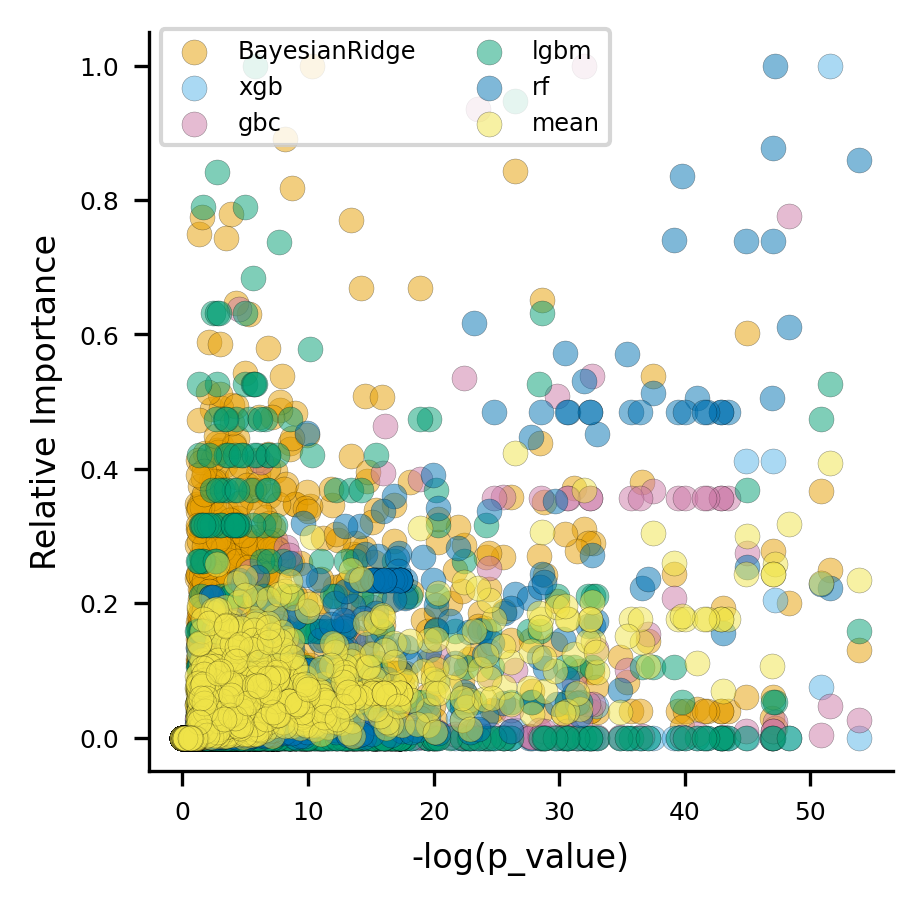

In [23]:
scatter_plot = plot_scatter(summary_result=sr, report_dir=report_dir)

In [24]:
%%time
mean_imp = mean_importance(top, report_dir=report_dir)

CPU times: total: 391 ms
Wall time: 336 ms


mean Done


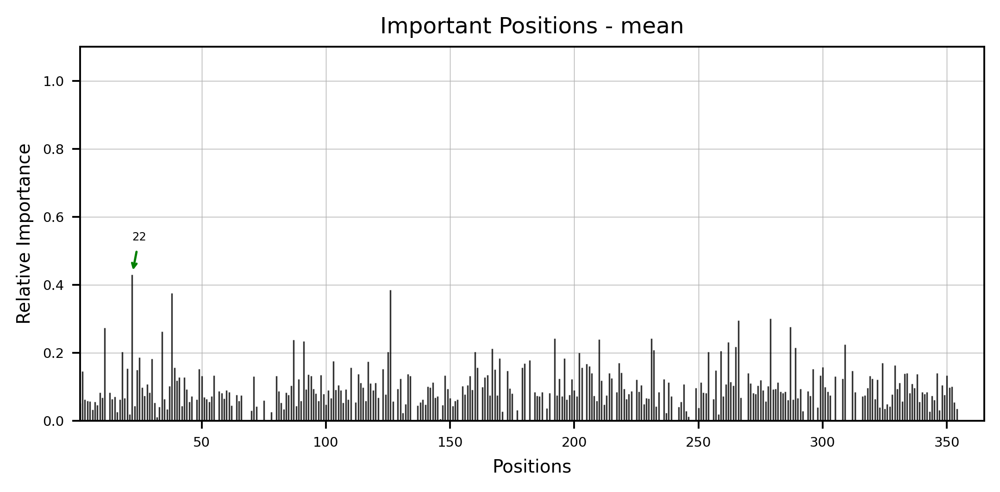

In [25]:
dp_plot(importance=mean_imp,imp_col='mean', model_name='mean', report_dir=report_dir)

In [26]:
tr = prep_pipeline[:4].fit_transform(tr)

BayesianRidge Done
BayesianRidge  Done
xgb Done
xgb  Done
gbc Done
gbc  Done
lgbm Done
lgbm  Done
rf Done
rf  Done


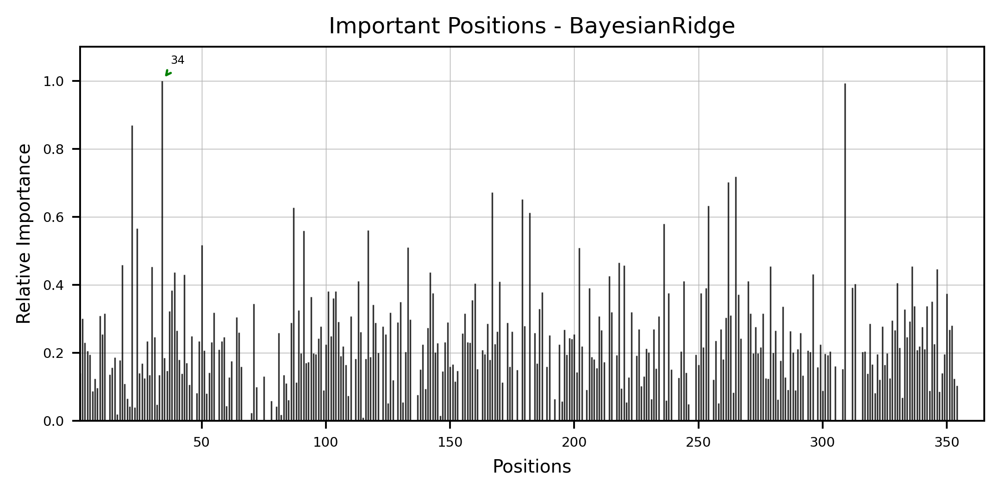

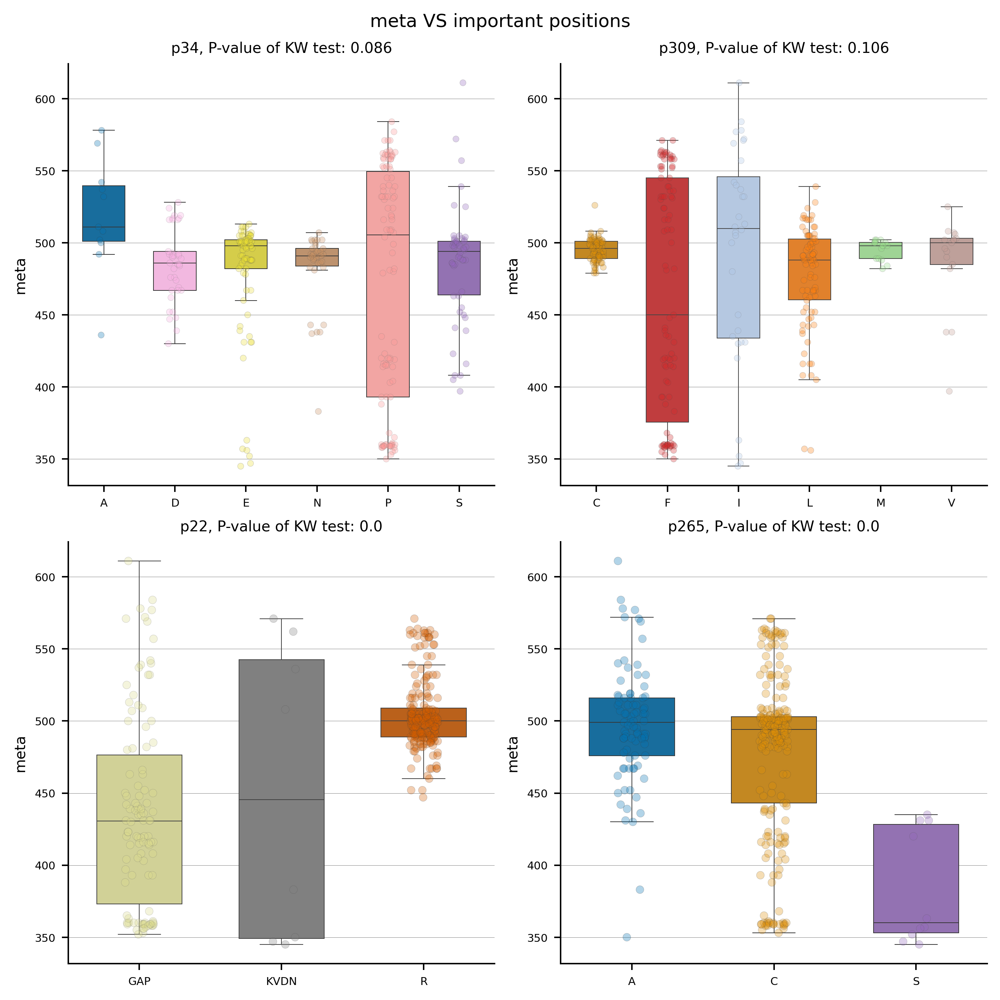

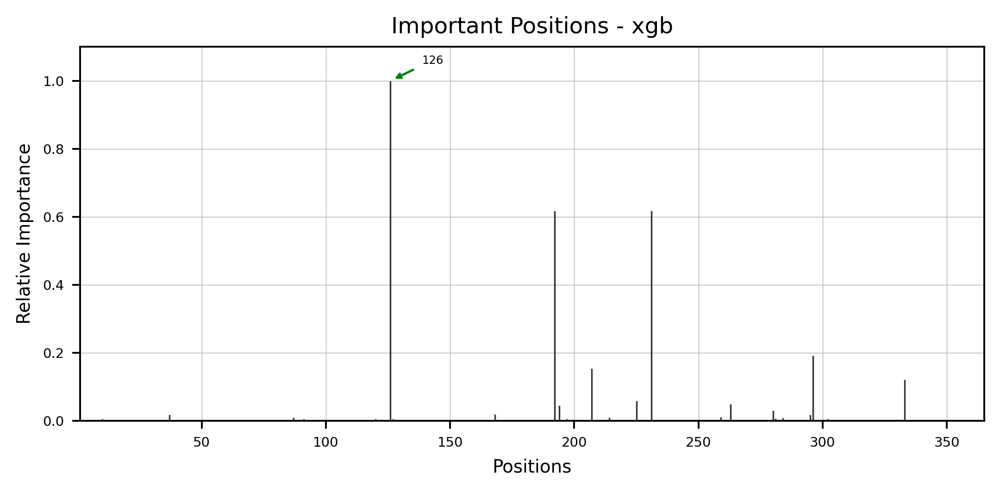

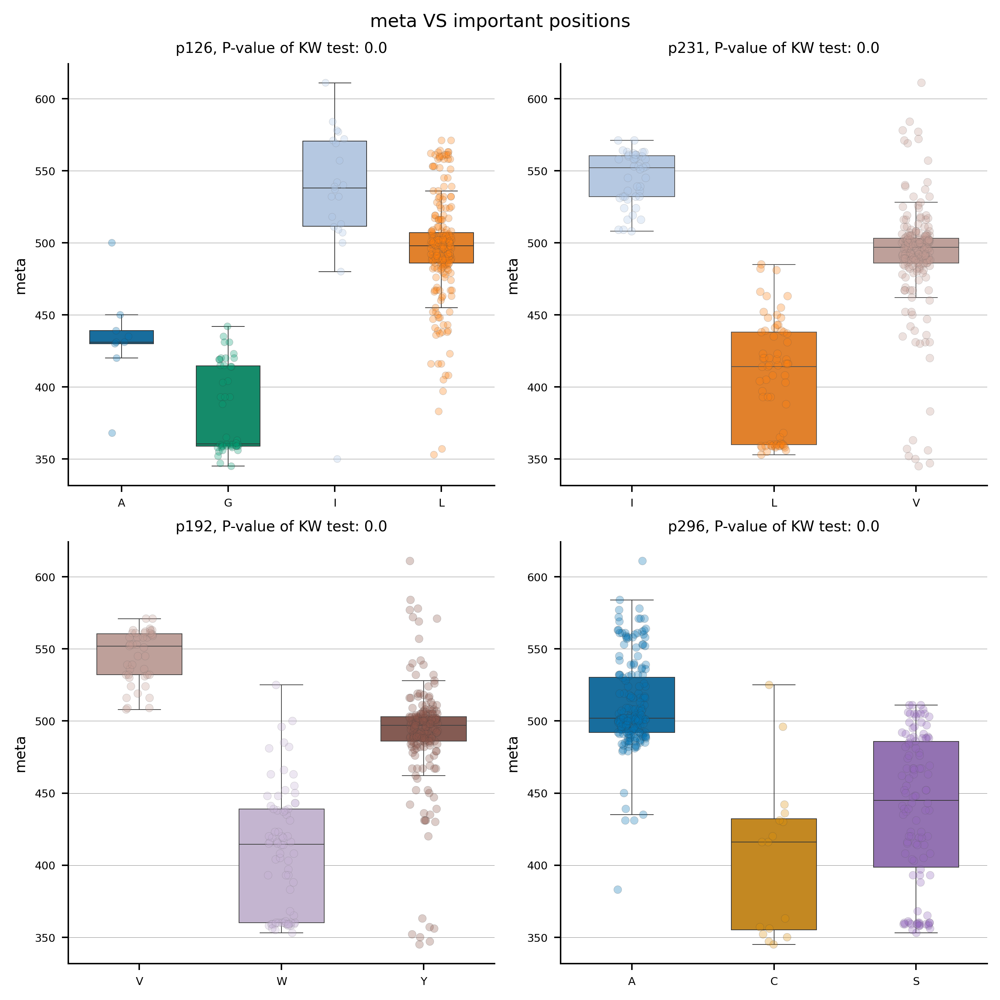

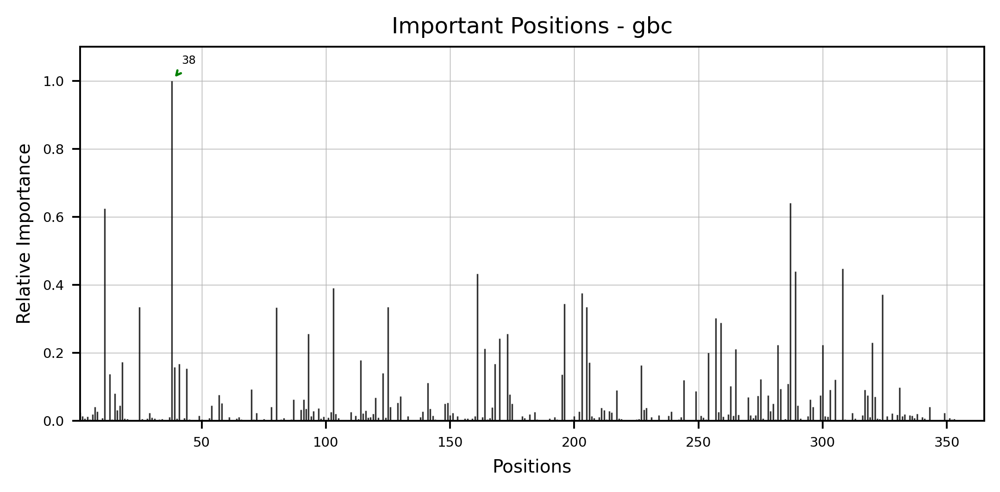

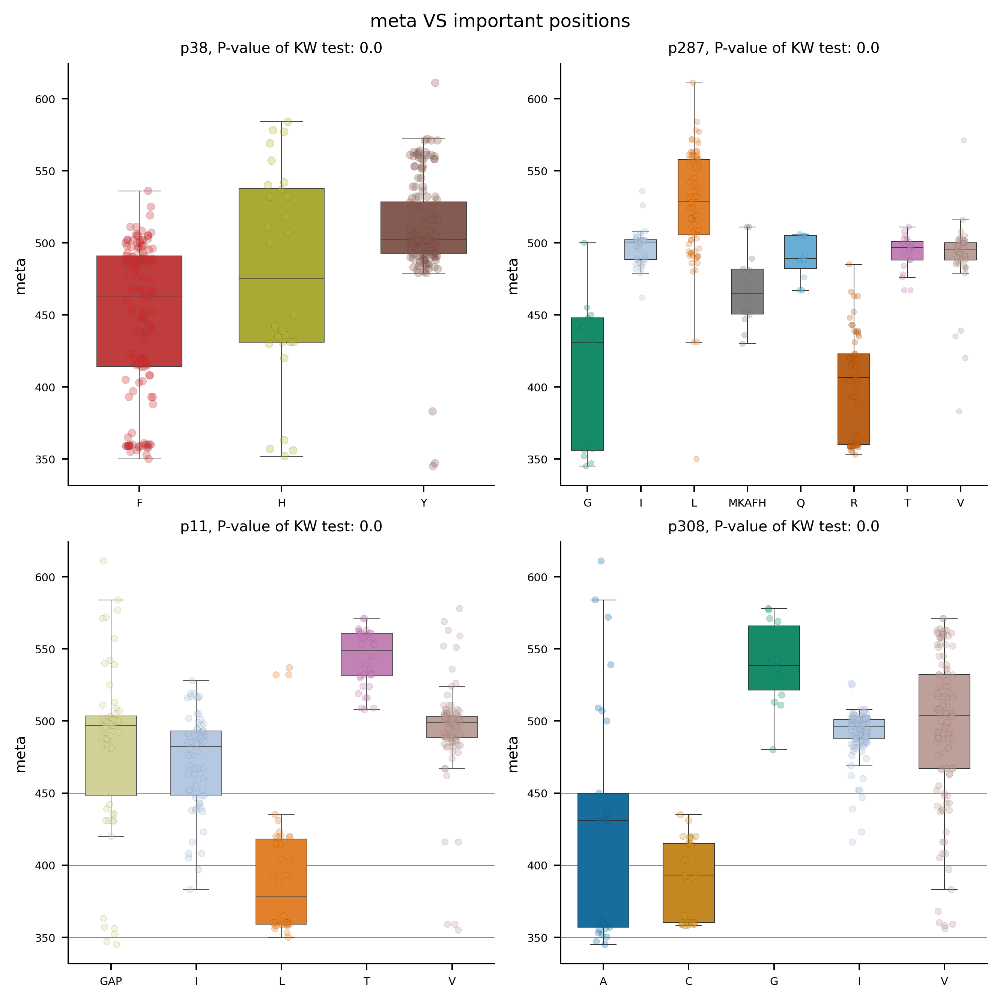

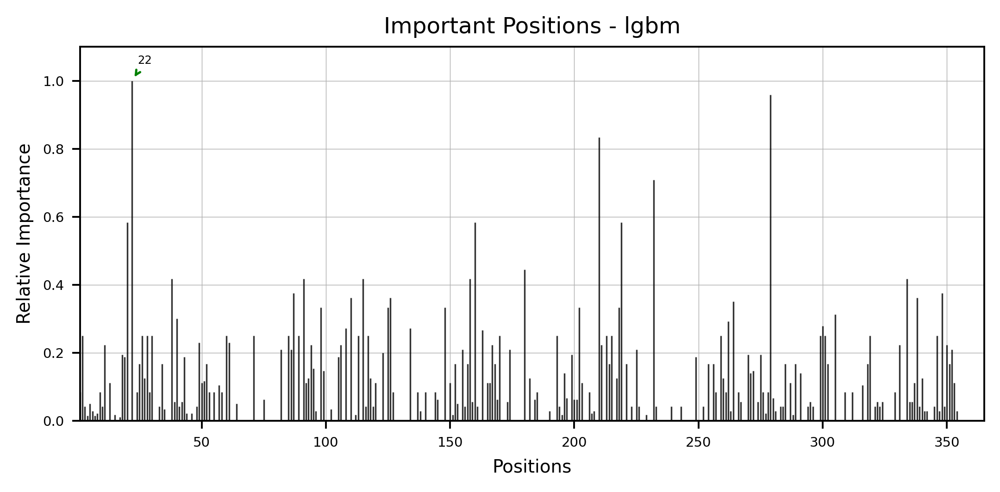

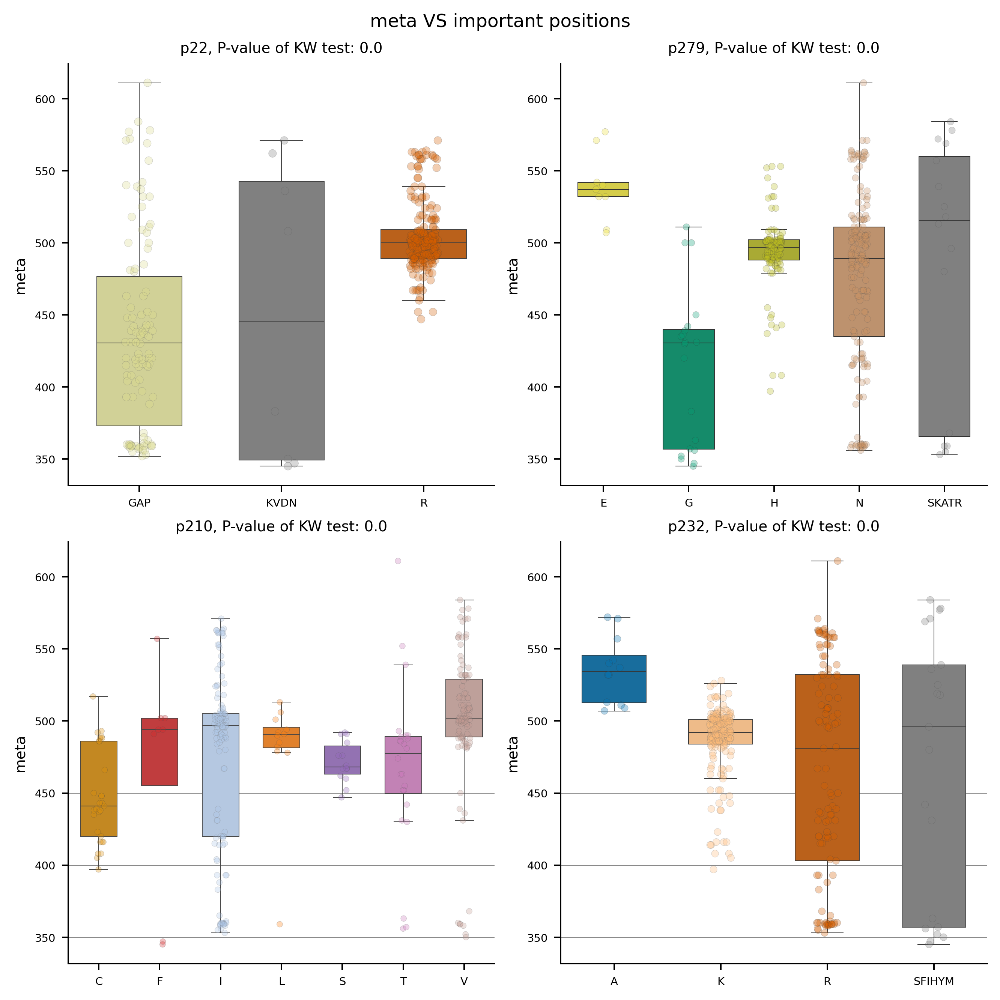

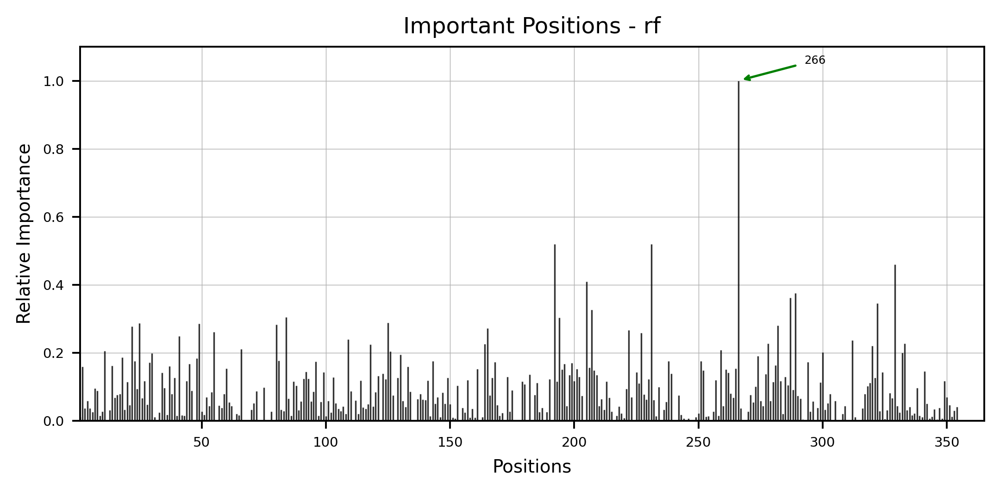

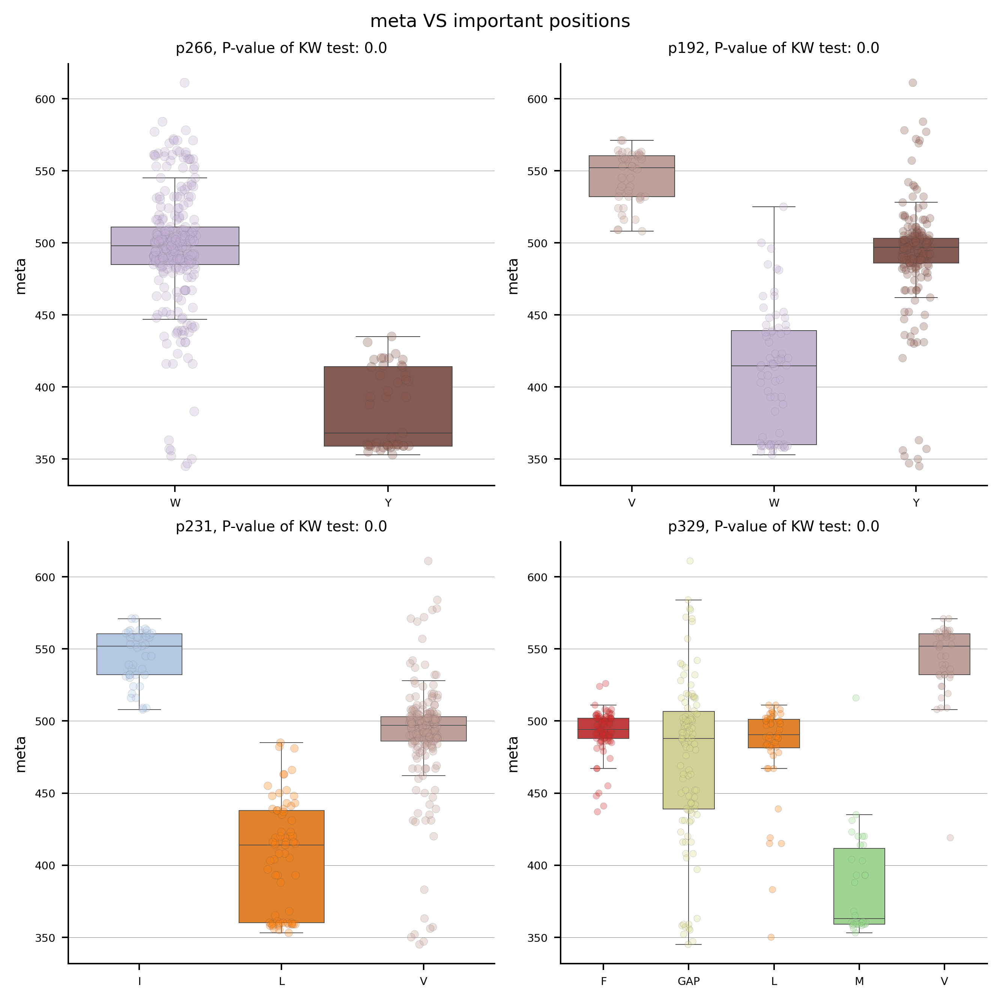

In [27]:
for model in top:
    model_name = model.steps[-1][0]
    dp_plot(importance=importance_from_pipe(model),
            imp_col='standard_value',
            model_name = model_name, report_dir=report_dir)
    
    plot_imp_model(importance=importance_from_pipe(model), 
               X_train=tr, y_train=y, model_name=model_name,
                   meta_var='meta', model_type=ana_type, report_dir=report_dir)

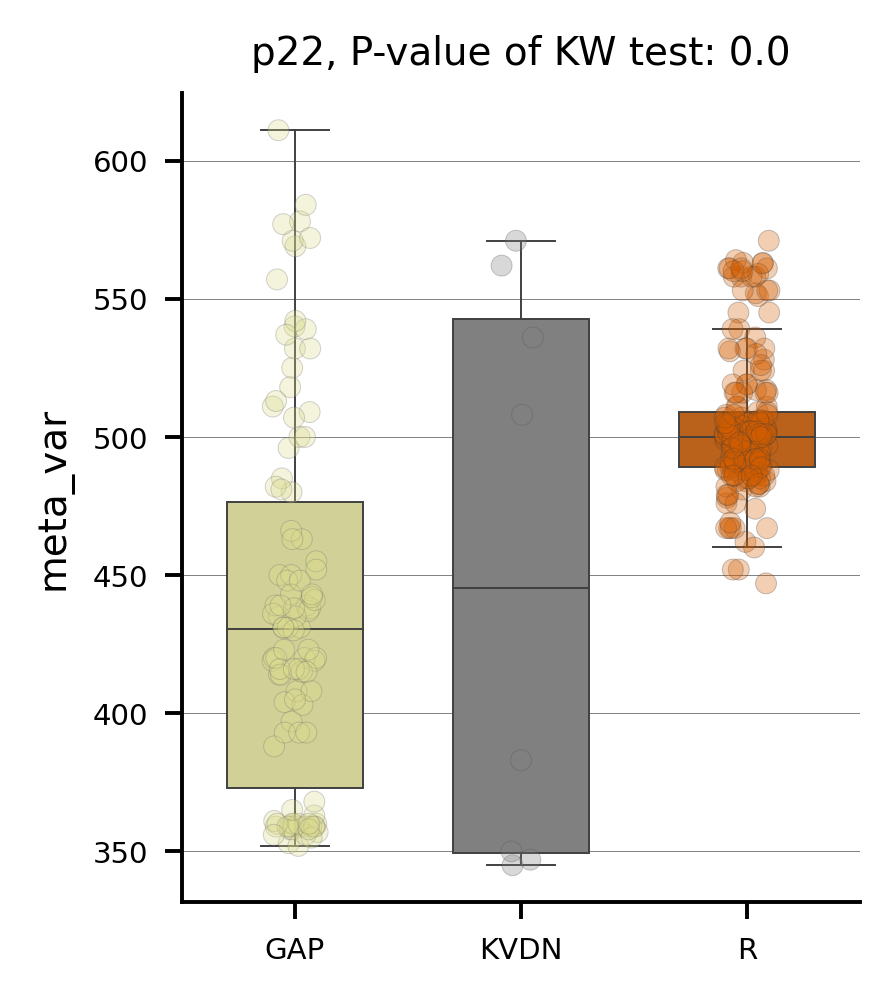

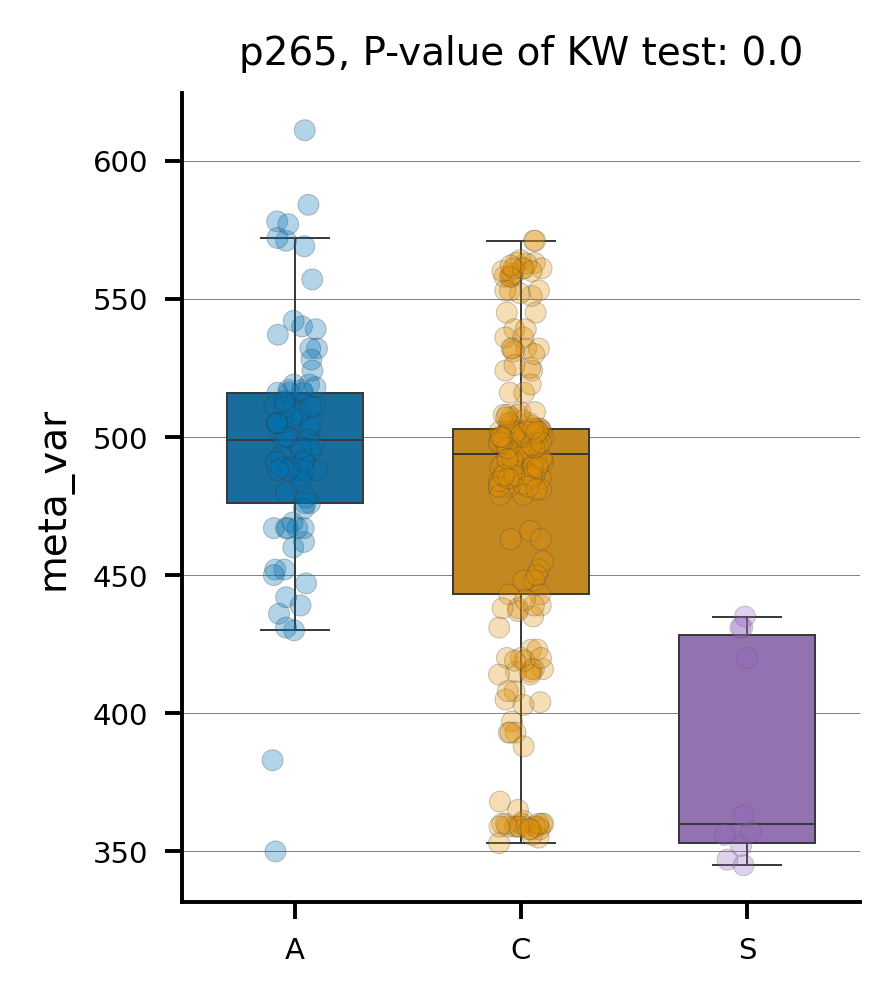

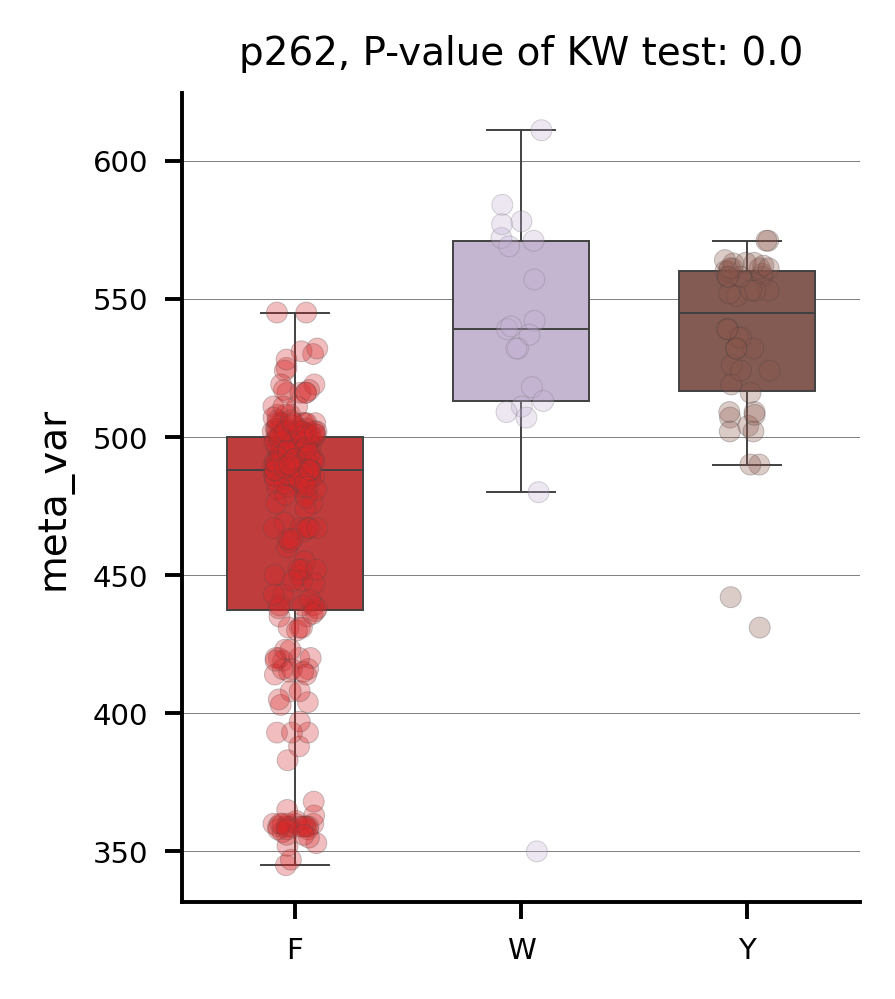

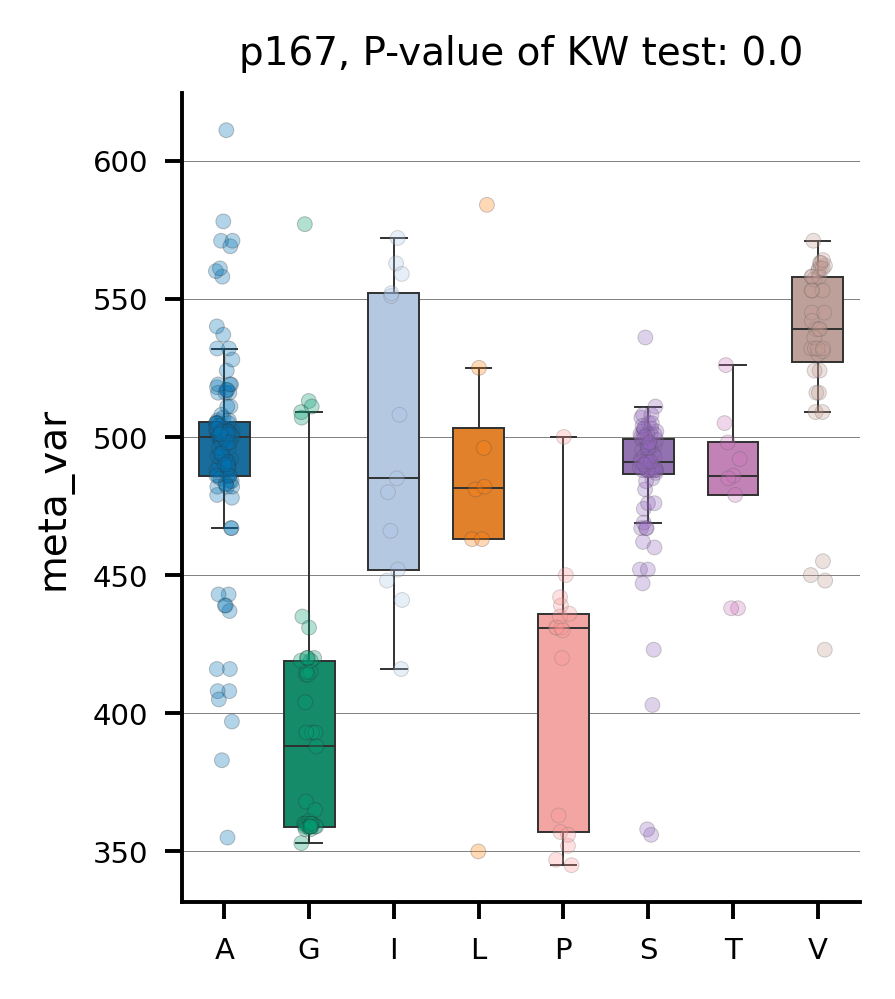

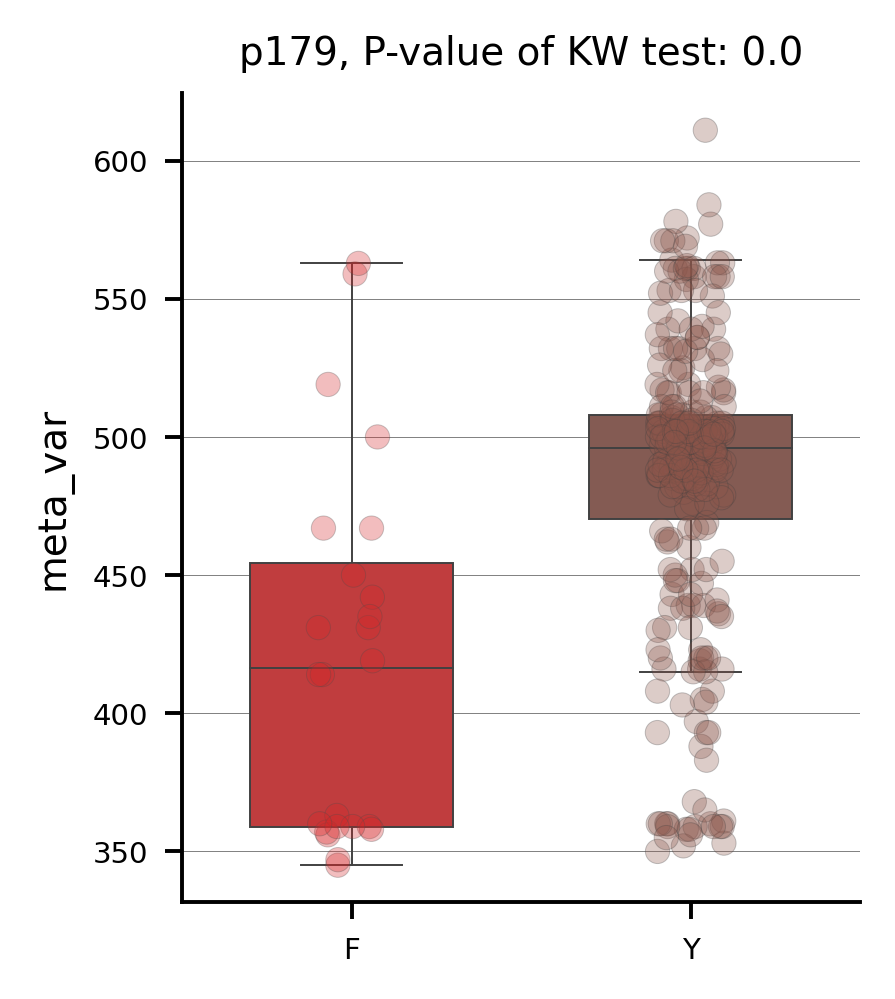

...

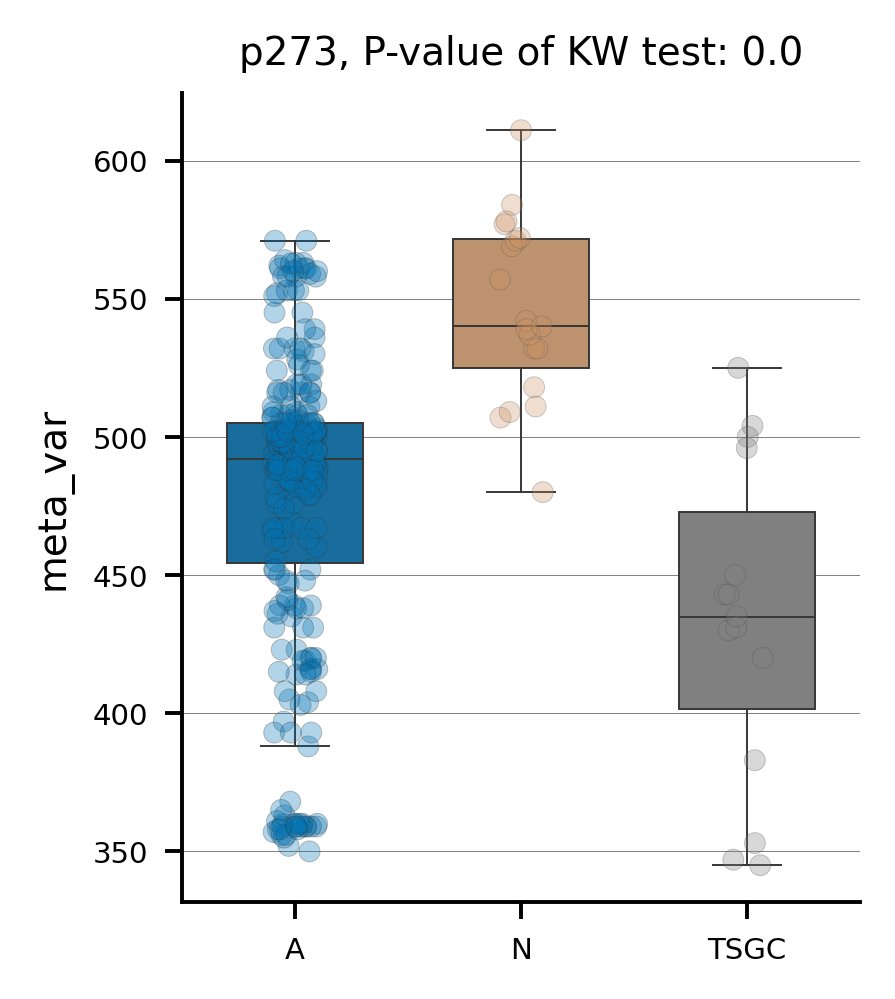

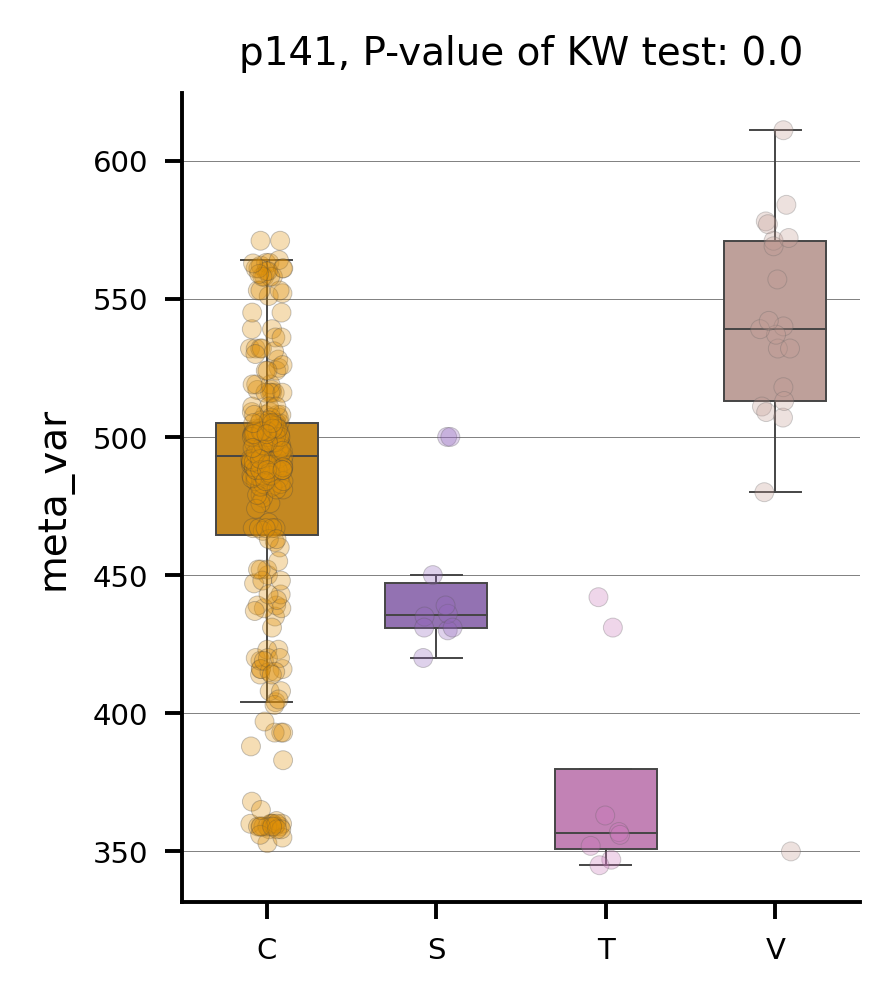

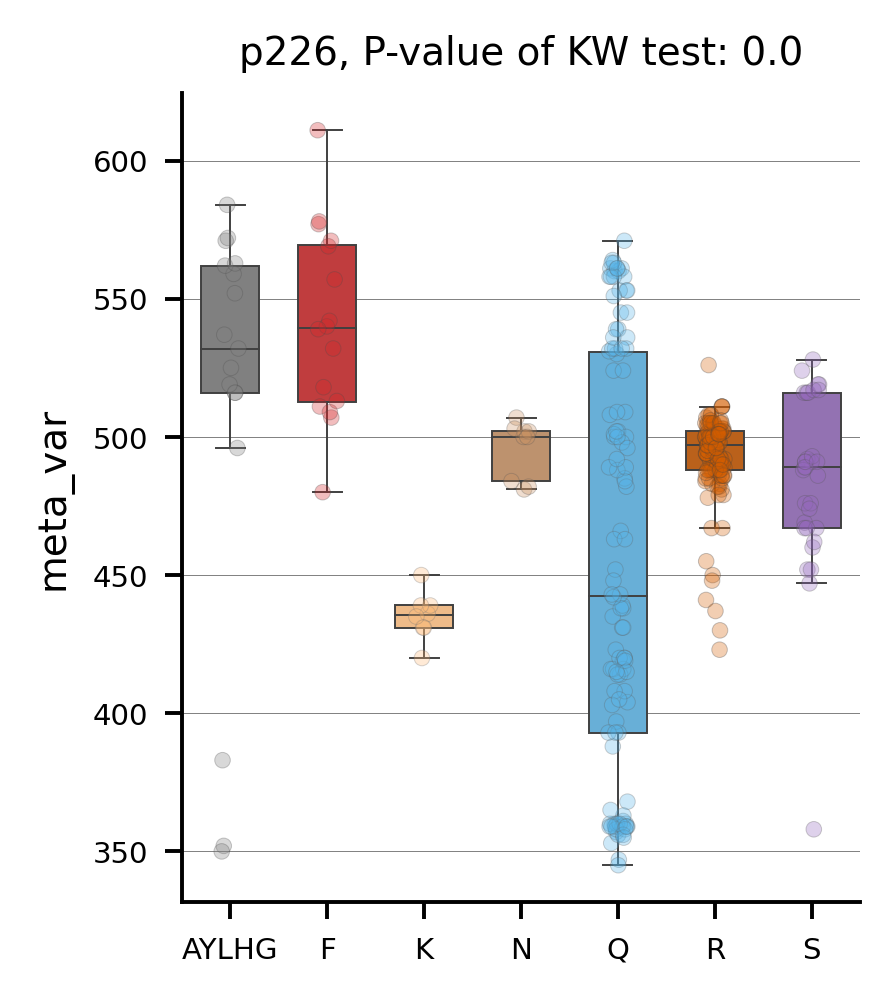

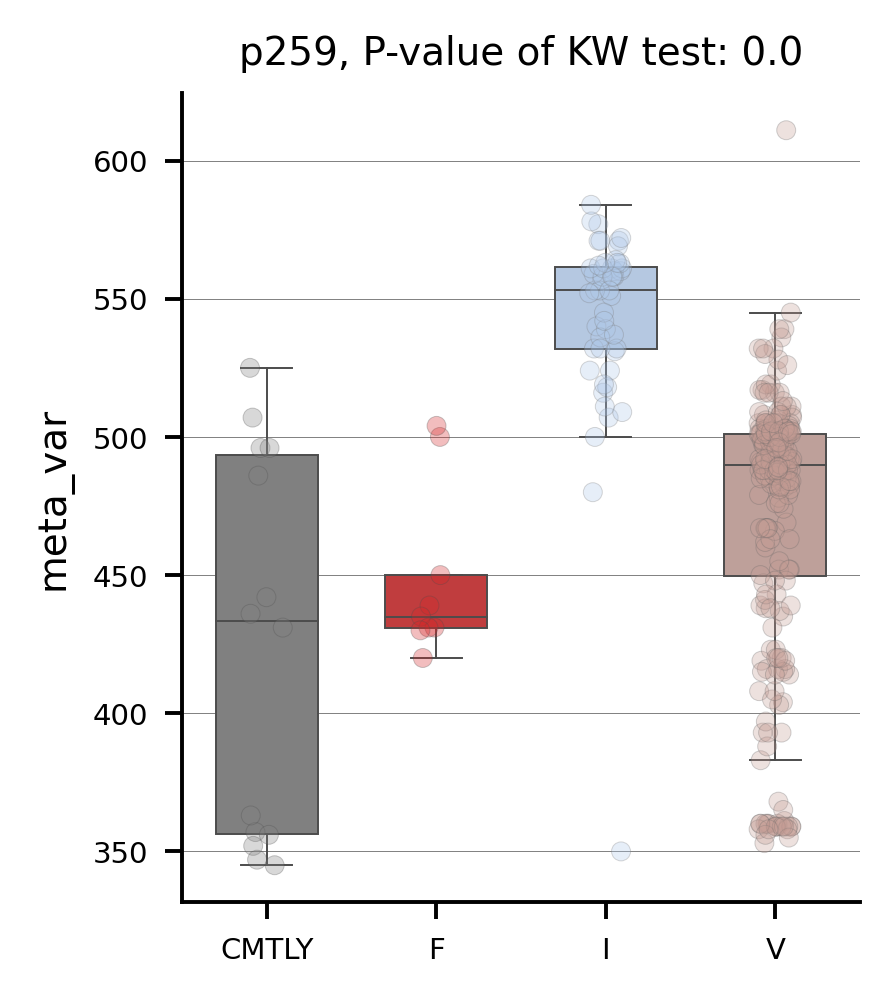

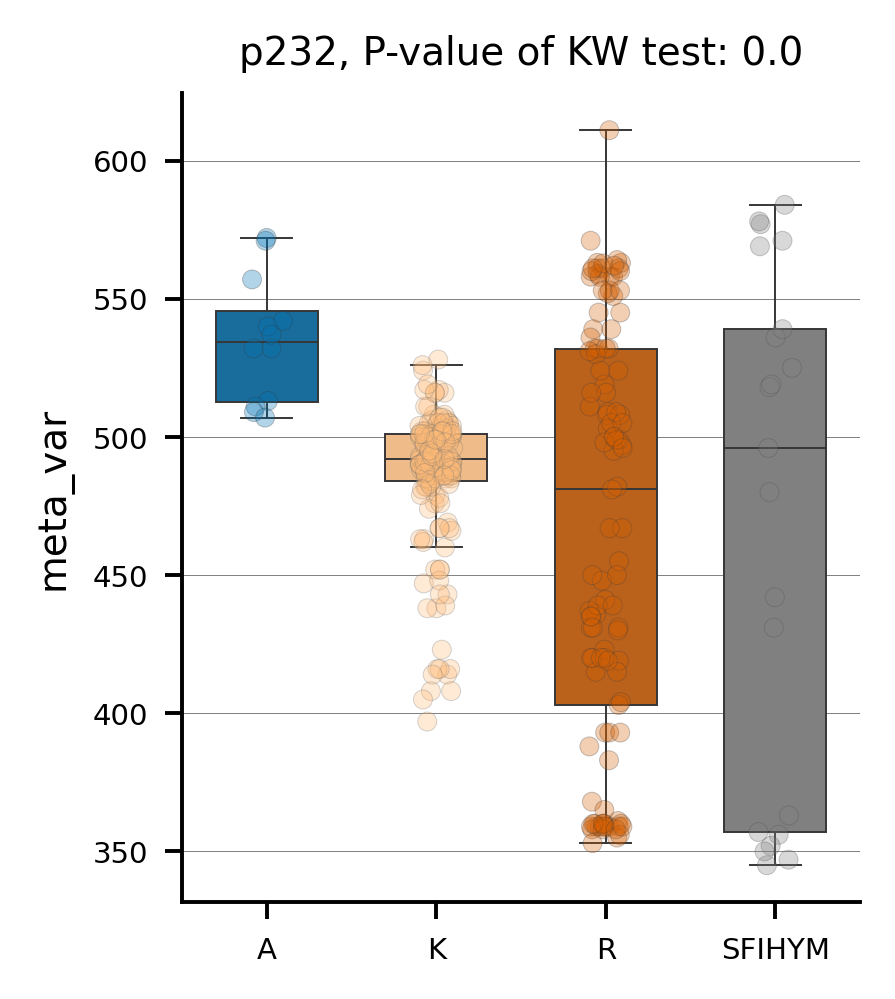

In [28]:
pl = plot_imp_all(final_models=top,
                  X_train=tr, y_train=y,
                  model_type = ana_type,
                  report_dir=report_dir, max_plots=100,
                  figsize=(2.5, 3))

In [29]:
from deepBreaks.utils import load_obj
import joblib
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
from sklearn.metrics import mean_absolute_error
from sklearn.metrics import mean_absolute_percentage_error
from sklearn.metrics import mean_squared_error
import re

In [30]:
top_per_mod = report_dir + '/' + mtml[0] + '.pkl'
load_top_mod = load_obj(top_per_mod)

[498.44939076 495.77562438 498.91005836 499.27302614 500.08305075
 501.49079191 494.72671745 495.69277994 500.08305075 500.08305075
 500.08305075 500.08305075 500.08305075 494.88275533 497.1005211
 500.08305075 500.08305075 500.16574967 509.02291112 495.22794552
 500.50548205 488.75769882 491.96120312 501.79737574 494.50754231
 501.36816253 499.46169546 494.23253218 504.34910334 503.12385383
 505.06608441 504.03369559 492.21154159 504.03369559 505.06608441
 504.52040955 499.15761909 502.45084777 513.29731349 499.72013825
 507.33400915 502.49442706 510.10829796 510.10829796 501.99319899
 498.67736229 511.72427996 506.77148999 503.12385383 502.42113399
 502.42113399 502.42113399 504.52040955 484.57379133 488.90193069
 486.75389291 484.57379133 488.90193069 486.75389291 495.94477364
 487.27222317 484.57379133 488.90193069 486.75389291 500.20742399
 525.26080406 500.08305075 501.56969746 500.08305075 501.56969746
 489.26259644 499.20114786 479.05097318 488.38069355 484.03363414
 478.169070

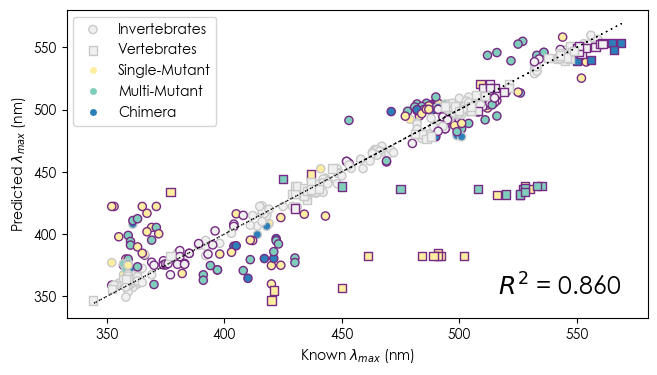

<Figure size 750x400 with 0 Axes>

0.8596074315906694
12.359140654806188
0.029191556933745016
552.9984338876626
23.515918733650672


In [32]:
inv = 'Chordata'
predictions = load_top_mod.predict(mut)
print(predictions)
mut_metadata = path + "mut_meta.tsv"
mut_meta = pd.read_csv(mut_metadata, sep="\t", index_col = 0)
mut_meta = mut_meta.drop(mut_meta.index[0])
#mut_meta.head()
mut_meta['Prediction'] = predictions
mut_meta['Difference'] = mut_meta['Prediction'] - mut_meta['Lambda_Max']

mut_meta = mut_meta[['Species', 'Phylum','Opsin_Family', 'Accession','Lambda_Max','Prediction','Difference']]
mut_meta.to_csv(path_or_buf= f'{report_dir}/mut_results.csv',index = 'Feature',mode="w")
true_lmax = mut_meta['Lambda_Max']
mut_meta.head()

wt_metadata = path + "wt_meta.tsv"
wt_meta = pd.read_csv(wt_metadata, sep="\t", index_col = 0)

edgecolors = []
colors = []
wt_acc_list = []
wt_lmax = []
mut_diff = []
for ind in mut_meta.index:
    if abs(mut_meta['Difference'][ind]) >= 10:
        if inv != mut_meta['Phylum'][ind]:
            if '-' in mut_meta['Accession'][ind]:
                colors.append('#2c7fb8')
            elif mut_meta['Accession'][ind].count('_') > 1 or mut_meta['Accession'][ind].count(',') > 1:
                p = re.compile('^.._')
                if p.match(mut_meta['Accession'][ind]) and mut_meta['Accession'][ind].count('_') == 2:
                    colors.append('#ffeda0')
                else:
                    colors.append('#7fcdbb')
            else:
                colors.append('#ffeda0')
        else:
            if '-' in mut_meta['Accession'][ind]:
                colors.append('#2c7fb8')
            elif mut_meta['Accession'][ind].count('_') > 1 or mut_meta['Accession'][ind].count(',') >= 1:
                p = re.compile('^.._')
                if p.match(mut_meta['Accession'][ind]) and mut_meta['Accession'][ind].count('_') == 2:
                    colors.append('#ffeda0')
                else:
                    colors.append('#7fcdbb')
            else:
                colors.append('#ffeda0')
    else:
        colors.append('#f0f0f0')
    
    repeat_check = 0
    for wt in wt_meta.index:
        if repeat_check < 1:
            acc = wt_meta['Accession'][wt]
            acc = acc.split('.')[0]
            wt_acc = re.compile(f"^{acc}")

            if wt_acc.match(mut_meta['Accession'][ind]):
                if abs(wt_meta['Lambda_Max'][wt]-mut_meta['Lambda_Max'][ind]) >= 10:
                    edgecolors.append('#762a83')
                else:
                    edgecolors.append('#c9c9c9')
                diff = abs(wt_meta['Lambda_Max'][wt]-mut_meta['Lambda_Max'][ind])
                mut_diff.append(diff)
                wt_acc_list.append(wt_meta['Accession'][wt])
                wt_lmax.append(wt_meta['Lambda_Max'][wt])

                repeat_check += 1
            else:
                pass
        else:
            pass
    if repeat_check == 0:
        edgecolors.append('#c9c9c9')
        mut_diff.append('NA')
        wt_acc_list.append('No Match')
        wt_lmax.append('NA')
    else:
        pass

mut_wt_comp = pd.DataFrame()
mut_wt_comp["Mut_Acc"] = mut_meta["Accession"]
mut_wt_comp["WT_Acc"] = wt_acc_list
mut_wt_comp["Mut_Lmax"] = mut_meta["Lambda_Max"]
mut_wt_comp["WT_Lmax"] = wt_lmax
mut_wt_comp["Abs_Diff"] = mut_diff
mut_wt_comp["Edge_Colors"] = edgecolors
mut_wt_comp.to_csv(path_or_buf= f'{report_dir}/wt_mut_comp.csv',index_label=True,mode="w")

# Create a new column 'Marker' based on 'Phylum'
mut_meta['Marker'] = np.where(mut_meta['Phylum'] == inv, 'o', 's')

markers = mut_meta['Marker'].tolist()

#Adding in out desired font - feel free to change. :)
plt.rcParams['font.family'] = 'Century Gothic'
plt.rcParams["figure.figsize"] = [7.50, 4.00]
#plt.title("$λ_{max}$ Predictions for Unseen Mutant Data")

mask_o = np.array(markers) == 'o'
mask_s = np.array(markers) == 's'

# Create two separate scatter plots for invertebrates and vertebrates
scatter1 = plt.scatter(true_lmax[mask_o], predictions[mask_o], c=np.array(colors)[mask_o], ec=np.array(edgecolors)[mask_o], edgecolors='k', s=35, alpha=1.0, marker='o', label='Invertebrates')
scatter2 = plt.scatter(true_lmax[mask_s], predictions[mask_s], c=np.array(colors)[mask_s], ec=np.array(edgecolors)[mask_s], edgecolors='k', s=35, alpha=1.0, marker='s', label='Vertebrates')


plt.plot(true_lmax, true_lmax, c='k', linewidth='1.0', ls='--', dashes=(1, 3))
plt.xlabel('Known $λ_{max}$ (nm)')
plt.ylabel('Predicted $λ_{max}$ (nm)')
plt.annotate(f"$R^2$ = {load_top_mod.score(mut, true_lmax):.3f}", (max(true_lmax), min(predictions)), ha='right', va='bottom', fontsize=18, c='k')
# Custom legend handles and labels
legend_handles = [scatter1, scatter2, plt.Line2D([0], [0], marker='.', color='w', markerfacecolor='#ffeda0', markersize=12), plt.Line2D([0], [0], marker='.', color='w', markerfacecolor='#7fcdbb', markersize=12), plt.Line2D([0], [0], marker='.', color='w', markerfacecolor='#2c7fb8', markersize=12)]
legend_labels = ['Invertebrates', 'Vertebrates', 'Single-Mutant', 'Multi-Mutant', 'Chimera']

# Add legend on the top left corner
plt.legend(handles=legend_handles, labels=legend_labels, loc='upper left')

fileout = f'{report_dir}/final_wt_mut_test_v1.pdf'
plt.savefig(fileout)
fileout = 'final_wt_mut_test_v1.svg'
plt.savefig(fileout, format='svg', bbox_inches='tight')
fileout = 'final_wt_mut_test_v1.png'
plt.savefig(fileout, format='png',  dpi=300)
plt.show()
plt.clf()
plt.show()

model_testing_report = f'{report_dir}/model_testing report.tsv'

base_rsq = load_top_mod.score(mut, true_lmax)
print(base_rsq)

base_mae = mean_absolute_error(predictions, true_lmax)
print(base_mae)

base_mape = mean_absolute_percentage_error(predictions, true_lmax)
print(base_mape)

base_sqe = mean_squared_error(predictions, true_lmax)
print(base_sqe)

base_rsqe = mean_squared_error(predictions, true_lmax, squared=False)
print(base_rsqe)

with open(model_testing_report, 'w') as f:
    f.write(f'Base Model R^2\tBase Model MAE\tBase Model MAPE\tBase Model SQE\tBase Model RSQE\n')
    f.write(f'{str(base_rsq)}\t{str(base_mae)}\t{str(base_mape)}\t{str(base_sqe)}\t{str(base_rsqe)}')

[498.44939076 495.77562438 498.91005836 499.27302614 500.08305075
 501.49079191 494.72671745 495.69277994 500.08305075 500.08305075
 500.08305075 500.08305075 500.08305075 494.88275533 497.1005211
 500.08305075 500.08305075 500.16574967 509.02291112 495.22794552
 500.50548205 488.75769882 491.96120312 501.79737574 494.50754231
 501.36816253 499.46169546 494.23253218 504.34910334 503.12385383
 505.06608441 504.03369559 492.21154159 504.03369559 505.06608441
 504.52040955 499.15761909 502.45084777 513.29731349 499.72013825
 507.33400915 502.49442706 510.10829796 510.10829796 501.99319899
 498.67736229 511.72427996 506.77148999 503.12385383 502.42113399
 502.42113399 502.42113399 504.52040955 484.57379133 488.90193069
 486.75389291 484.57379133 488.90193069 486.75389291 495.94477364
 487.27222317 484.57379133 488.90193069 486.75389291 500.20742399
 525.26080406 500.08305075 501.56969746 500.08305075 501.56969746
 489.26259644 499.20114786 479.05097318 488.38069355 484.03363414
 478.169070

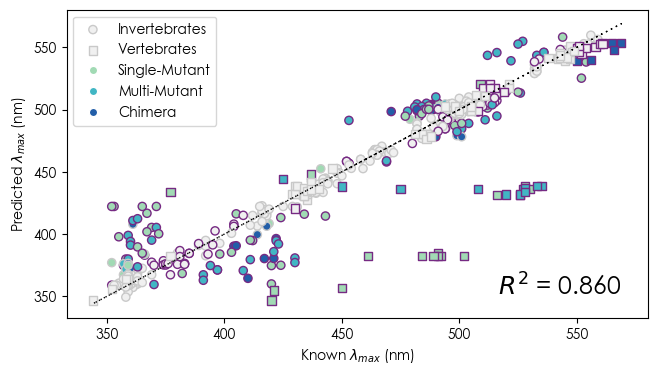

<Figure size 750x400 with 0 Axes>

0.8596074315906694
12.359140654806188
0.029191556933745016
552.9984338876626
23.515918733650672


In [35]:
inv = 'Chordata'
predictions = load_top_mod.predict(mut)
print(predictions)
mut_metadata = path + "mut_meta.tsv"
mut_meta = pd.read_csv(mut_metadata, sep="\t", index_col = 0)
mut_meta = mut_meta.drop(mut_meta.index[0])
#mut_meta.head()
mut_meta['Prediction'] = predictions
mut_meta['Difference'] = mut_meta['Prediction'] - mut_meta['Lambda_Max']

mut_meta = mut_meta[['Species', 'Phylum','Opsin_Family', 'Accession','Lambda_Max','Prediction','Difference']]
mut_meta.to_csv(path_or_buf= f'{report_dir}/mut_results.csv',index = 'Feature',mode="w")
true_lmax = mut_meta['Lambda_Max']
mut_meta.head()

wt_metadata = path + "wt_meta.tsv"
wt_meta = pd.read_csv(wt_metadata, sep="\t", index_col = 0)

edgecolors = []
colors = []
wt_acc_list = []
wt_lmax = []
mut_diff = []
for ind in mut_meta.index:
    if abs(mut_meta['Difference'][ind]) >= 10:
        if inv != mut_meta['Phylum'][ind]:
            if '-' in mut_meta['Accession'][ind]:
                #dark blue - chimeras
                colors.append('#225ea8')
            elif mut_meta['Accession'][ind].count('_') > 1 or mut_meta['Accession'][ind].count(',') > 1:
                p = re.compile('^.._')
                if p.match(mut_meta['Accession'][ind]) and mut_meta['Accession'][ind].count('_') == 2:
                    #green-blue - one mutation
                    colors.append('#a1dab4')
                else:
                    #blue - multiple mutations
                    colors.append('#41b6c4')
            else:
                #green-blue - one mutation
                colors.append('#a1dab4')
        else:
            if '-' in mut_meta['Accession'][ind]:
                #dark blue - chimeras
                colors.append('#225ea8')
            elif mut_meta['Accession'][ind].count('_') > 1 or mut_meta['Accession'][ind].count(',') >= 1:
                p = re.compile('^.._')
                if p.match(mut_meta['Accession'][ind]) and mut_meta['Accession'][ind].count('_') == 2:
                    #green-blue - one mutation
                    colors.append('#a1dab4')
                else:
                    #blue - multiple mutations
                    colors.append('#41b6c4')
            else:
                #green-blue - one mutation
                colors.append('#a1dab4')
    else:
        colors.append('#f0f0f0')
    
    repeat_check = 0
    for wt in wt_meta.index:
        if repeat_check < 1:
            acc = wt_meta['Accession'][wt]
            acc = acc.split('.')[0]
            wt_acc = re.compile(f"^{acc}")

            if wt_acc.match(mut_meta['Accession'][ind]):
                if abs(wt_meta['Lambda_Max'][wt]-mut_meta['Lambda_Max'][ind]) >= 10:
                    edgecolors.append('#762a83')
                else:
                    edgecolors.append('#c9c9c9')
                diff = abs(wt_meta['Lambda_Max'][wt]-mut_meta['Lambda_Max'][ind])
                mut_diff.append(diff)
                wt_acc_list.append(wt_meta['Accession'][wt])
                wt_lmax.append(wt_meta['Lambda_Max'][wt])

                repeat_check += 1
            else:
                pass
        else:
            pass
    if repeat_check == 0:
        edgecolors.append('#c9c9c9')
        mut_diff.append('NA')
        wt_acc_list.append('No Match')
        wt_lmax.append('NA')
    else:
        pass

mut_wt_comp = pd.DataFrame()
mut_wt_comp["Mut_Acc"] = mut_meta["Accession"]
mut_wt_comp["WT_Acc"] = wt_acc_list
mut_wt_comp["Mut_Lmax"] = mut_meta["Lambda_Max"]
mut_wt_comp["WT_Lmax"] = wt_lmax
mut_wt_comp["Abs_Diff"] = mut_diff
mut_wt_comp["Edge_Colors"] = edgecolors
mut_wt_comp.to_csv(path_or_buf= f'{report_dir}/wt_mut_comp.csv',index_label=True,mode="w")

# Create a new column 'Marker' based on 'Phylum'
mut_meta['Marker'] = np.where(mut_meta['Phylum'] == inv, 'o', 's')

markers = mut_meta['Marker'].tolist()

#Adding in out desired font - feel free to change. :)
plt.rcParams['font.family'] = 'Century Gothic'
plt.rcParams["figure.figsize"] = [7.50, 4.00]
#plt.title("$λ_{max}$ Predictions for Unseen Mutant Data")

mask_o = np.array(markers) == 'o'
mask_s = np.array(markers) == 's'

# Create two separate scatter plots for invertebrates and vertebrates
scatter1 = plt.scatter(true_lmax[mask_o], predictions[mask_o], c=np.array(colors)[mask_o], ec=np.array(edgecolors)[mask_o], edgecolors='k', s=35, alpha=1.0, marker='o', label='Invertebrates')
scatter2 = plt.scatter(true_lmax[mask_s], predictions[mask_s], c=np.array(colors)[mask_s], ec=np.array(edgecolors)[mask_s], edgecolors='k', s=35, alpha=1.0, marker='s', label='Vertebrates')


plt.plot(true_lmax, true_lmax, c='k', linewidth='1.0', ls='--', dashes=(1, 3))
plt.xlabel('Known $λ_{max}$ (nm)')
plt.ylabel('Predicted $λ_{max}$ (nm)')
plt.annotate(f"$R^2$ = {load_top_mod.score(mut, true_lmax):.3f}", (max(true_lmax), min(predictions)), ha='right', va='bottom', fontsize=18, c='k')
# Custom legend handles and labels
legend_handles = [scatter1, scatter2, plt.Line2D([0], [0], marker='.', color='w', markerfacecolor='#a1dab4', markersize=12), plt.Line2D([0], [0], marker='.', color='w', markerfacecolor='#41b6c4', markersize=12), plt.Line2D([0], [0], marker='.', color='w', markerfacecolor='#225ea8', markersize=12)]
legend_labels = ['Invertebrates', 'Vertebrates', 'Single-Mutant', 'Multi-Mutant', 'Chimera']

# Add legend on the top left corner
plt.legend(handles=legend_handles, labels=legend_labels, loc='upper left')

fileout = f'{report_dir}/final_wt_mut_test_v1.pdf'
plt.savefig(fileout)
fileout = 'final_wt_mut_test_v2.svg'
plt.savefig(fileout, format='svg', bbox_inches='tight')
fileout = 'final_wt_mut_test_v2.png'
plt.savefig(fileout, format='png',  dpi=300)
plt.show()
plt.clf()
plt.show()

model_testing_report = f'{report_dir}/model_testing report.tsv'

base_rsq = load_top_mod.score(mut, true_lmax)
print(base_rsq)

base_mae = mean_absolute_error(predictions, true_lmax)
print(base_mae)

base_mape = mean_absolute_percentage_error(predictions, true_lmax)
print(base_mape)

base_sqe = mean_squared_error(predictions, true_lmax)
print(base_sqe)

base_rsqe = mean_squared_error(predictions, true_lmax, squared=False)
print(base_rsqe)

with open(model_testing_report, 'w') as f:
    f.write(f'Base Model R^2\tBase Model MAE\tBase Model MAPE\tBase Model SQE\tBase Model RSQE\n')
    f.write(f'{str(base_rsq)}\t{str(base_mae)}\t{str(base_mape)}\t{str(base_sqe)}\t{str(base_rsqe)}')

In [ ]:
inv = 'Chordata'
predictions = load_top_mod.predict(mut)
print(predictions)
mut_metadata = path + "mut_meta.tsv"
mut_meta = pd.read_csv(mut_metadata, sep="\t", index_col = 0)
mut_meta = mut_meta.drop(mut_meta.index[0])
#mut_meta.head()
mut_meta['Prediction'] = predictions
mut_meta['Difference'] = mut_meta['Prediction'] - mut_meta['Lambda_Max']

mut_meta = mut_meta[['Species', 'Phylum','Opsin_Family', 'Accession','Lambda_Max','Prediction','Difference']]
mut_meta.to_csv(path_or_buf= f'{report_dir}/mut_results.csv',index = 'Feature',mode="w")
true_lmax = mut_meta['Lambda_Max']
mut_meta.head()

wt_metadata = path + "nmoc_meta.tsv"
wt_meta = pd.read_csv(wt_metadata, sep="\t", index_col = 0)

edgecolors = []
colors = []
wt_acc_list = []
wt_lmax = []
mut_diff = []
for ind in mut_meta.index:
    if abs(mut_meta['Difference'][ind]) >= 10:
        if inv != mut_meta['Phylum'][ind]:
            if '-' in mut_meta['Accession'][ind]:
                colors.append('#2c7fb8')
            elif mut_meta['Accession'][ind].count('_') > 1 or mut_meta['Accession'][ind].count(',') > 1:
                p = re.compile('^.._')
                if p.match(mut_meta['Accession'][ind]) and mut_meta['Accession'][ind].count('_') == 2:
                    colors.append('#ffeda0')
                else:
                    colors.append('#7fcdbb')
            else:
                colors.append('#ffeda0')
        else:
            if '-' in mut_meta['Accession'][ind]:
                colors.append('#2c7fb8')
            elif mut_meta['Accession'][ind].count('_') > 1 or mut_meta['Accession'][ind].count(',') >= 1:
                p = re.compile('^.._')
                if p.match(mut_meta['Accession'][ind]) and mut_meta['Accession'][ind].count('_') == 2:
                    colors.append('#ffeda0')
                else:
                    colors.append('#7fcdbb')
            else:
                colors.append('#ffeda0')
    else:
        colors.append('#f0f0f0')
    
    repeat_check = 0
    for wt in wt_meta.index:
        if repeat_check < 1:
            acc = wt_meta['Accession'][wt]
            acc = acc.split('.')[0]
            wt_acc = re.compile(f"^{acc}")

            if wt_acc.match(mut_meta['Accession'][ind]):
                if abs(wt_meta['Lambda_Max'][wt]-mut_meta['Lambda_Max'][ind]) >= 10:
                    edgecolors.append('#762a83')
                else:
                    edgecolors.append('#c9c9c9')
                diff = abs(wt_meta['Lambda_Max'][wt]-mut_meta['Lambda_Max'][ind])
                mut_diff.append(diff)
                wt_acc_list.append(wt_meta['Accession'][wt])
                wt_lmax.append(wt_meta['Lambda_Max'][wt])

                repeat_check += 1
            else:
                pass
        else:
            pass
    if repeat_check == 0:
        edgecolors.append('#c9c9c9')
        mut_diff.append('NA')
        wt_acc_list.append('No Match')
        wt_lmax.append('NA')
    else:
        pass

mut_wt_comp = pd.DataFrame()
mut_wt_comp["Mut_Acc"] = mut_meta["Accession"]
mut_wt_comp["WT_Acc"] = wt_acc_list
mut_wt_comp["Mut_Lmax"] = mut_meta["Lambda_Max"]
mut_wt_comp["WT_Lmax"] = wt_lmax
mut_wt_comp["Abs_Diff"] = mut_diff
mut_wt_comp["Edge_Colors"] = edgecolors
mut_wt_comp.to_csv(path_or_buf= f'{report_dir}/wt_mut_comp.csv',index_label=True,mode="w")

# Create a new column 'Marker' based on 'Phylum'
mut_meta['Marker'] = np.where(mut_meta['Phylum'] == inv, 'o', 's')

markers = mut_meta['Marker'].tolist()

plt.rcParams["font.family"] = "times new roman"
plt.rcParams["figure.figsize"] = [7.50, 4.00]
#plt.title("$λ_{max}$ Predictions for Unseen Mutant Data")

mask_o = np.array(markers) == 'o'
mask_s = np.array(markers) == 's'

# Create two separate scatter plots for invertebrates and vertebrates
scatter1 = plt.scatter(true_lmax[mask_o], predictions[mask_o], c=np.array(colors)[mask_o], ec=np.array(edgecolors)[mask_o], edgecolors='k', s=35, alpha=1.0, marker='o', label='Invertebrates')
scatter2 = plt.scatter(true_lmax[mask_s], predictions[mask_s], c=np.array(colors)[mask_s], ec=np.array(edgecolors)[mask_s], edgecolors='k', s=35, alpha=1.0, marker='s', label='Vertebrates')


plt.plot(true_lmax, true_lmax, c='k', linewidth='1.0', ls='--', dashes=(1, 3))
plt.xlabel('Known $λ_{max}$ (nm)')
plt.ylabel('Predicted $λ_{max}$ (nm)')
# Custom legend handles and labels
# Add legend inside the graph with bbox_to_anchor
legend_handles = [scatter1, scatter2, plt.Line2D([0], [0], marker='.', color='w', markerfacecolor='#ffeda0', markersize=12),
                  plt.Line2D([0], [0], marker='.', color='w', markerfacecolor='#7fcdbb', markersize=12),
                  plt.Line2D([0], [0], marker='.', color='w', markerfacecolor='#2c7fb8', markersize=12)]
legend_labels = ['Invertebrates', 'Vertebrates', 'Single-Mutant', 'Multi-Mutant', 'Chimera']

# Adjust bbox_to_anchor values to place the legend inside the graph
plt.legend(handles=legend_handles, labels=legend_labels, loc='upper left', bbox_to_anchor=(0.02, 0.98))

# Adjust the coordinates for the R^2 annotation
plt.text(0.28, 0.90, f"$R^2$ = {load_top_mod.score(mut, true_lmax):.3f}", ha='left', va='center', fontsize=20, c='k', transform=plt.gca().transAxes)


fileout = f'{report_dir}/alt_wt_mut_test.pdf'
plt.savefig(fileout)
fileout = 'alt_wt_mut_test.svg'
plt.savefig(fileout, format='svg', bbox_inches='tight')
plt.show()
plt.clf()
plt.show()

model_testing_report = f'{report_dir}/model_testing report.tsv'

base_rsq = load_top_mod.score(mut, true_lmax)
print(base_rsq)

base_mae = mean_absolute_error(predictions, true_lmax)
print(base_mae)

base_mape = mean_absolute_percentage_error(predictions, true_lmax)
print(base_mape)

base_sqe = mean_squared_error(predictions, true_lmax)
print(base_sqe)

base_rsqe = mean_squared_error(predictions, true_lmax, squared=False)
print(base_rsqe)

with open(model_testing_report, 'w') as f:
    f.write(f'Base Model R^2\tBase Model MAE\tBase Model MAPE\tBase Model SQE\tBase Model RSQE\n')
    f.write(f'{str(base_rsq)}\t{str(base_mae)}\t{str(base_mape)}\t{str(base_sqe)}\t{str(base_rsqe)}')

# <font color=red>STEP 4: Translate Candidate STSs</font> 
## Optional step IF running the classifier model, but could still be useful.
### To find CSTSs, got to the deepBreaks output folder and find the excel sheet 'avg_top_models_feature_importance'
### Sort the top model's feature importance column by 'largest-to-smallest' and take x# of those positions.

In [ ]:
import pandas as pd
import os

In [ ]:
#STEP 4: Translate Candidate STSs 
#translate candidate STSs to the bovine or squid equivalent 
    #bovine and squid sequence dataframes were saved earlier and are called again here
m = 0
tm = ''
k=0
gaps=0
#import importance_report.csv from report_dir
true_pos = []
aa = []
tmd = []
df = pd.read_csv(f'{report_dir}\importance_report.csv')
#take the list of important sites and translate them to the bovine standard equivalent, 
#we do this by taking the site number and subtracting the number of '-' between the start of the sequence and the desired site. 
for rows in reference_seq.values:  
    rows = str(rows)
    #print(rows)
    if rows == 'nan':
    #We want to write the 'true_pos', 'aa', and 'TMD' to the 'importance_report' csv file
        gaps += 1
        k += 1
        true_pos.append('NA')
        aa.append('-')
        tmd.append('NA')
    else:
        #print("The number of gaps is " + str(gaps))
        k+=1
        trans_site = k - gaps
        if ref_seq_name == 'bovine':
            if trans_site in range(3,37):
                tm = 'N-Termina'
            elif trans_site in range(37,62):
                tm = '1'
            elif trans_site in range(74,96):
                tm = '2'
            elif trans_site in range(111,133):
                tm = '3'
            elif trans_site in range(153,174):
                tm = '4'
            elif trans_site in range(203,225):
                tm = '5'
            elif trans_site in range(253,275):
                tm = '6'
            elif trans_site in range(287,309):
                tm = '7'
            else:
                tm = 'CT/EC'
        else:
            if trans_site in range(3,34):
                tm = 'N-Termina'
            elif trans_site in range(34,59):
                tm = '1'
            elif trans_site in range(71,97):
                tm = '2'
            elif trans_site in range(110,132):
                tm = '3'
            elif trans_site in range(152,173):
                tm = '4'
            elif trans_site in range(200,225):
                tm = '5'
            elif trans_site in range(262,284):
                tm = '6'
            elif trans_site in range(294,315):
                tm = '7'
            else:
                tm = 'CT/EC'                
        
        true_pos.append(str(trans_site))
        aa.append(rows)
        tmd.append(tm)
true_pos.pop()
aa.pop()
tmd.pop()

df['true_position'] = true_pos
df['TMD'] = tmd
df['amino_acid'] = aa
df.to_csv(path_or_buf= os.path.join(report_dir,r'importance_report.csv'),index = 'Feature',mode="w")
#df.head()
